In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets
from PIL import Image

import os
import torchvision.utils as vutils

import numpy as np
import matplotlib.pyplot as plt

In [4]:
from __future__ import print_function, division
import os
import glob
import torch
import torch.nn as nn
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, datasets, models

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [ ]:
import os
import glob

base_dir = '/content/drive/MyDrive/local'
folders = {'train': 40000, 'val': 5000, 'test': 5000}

for folder, expected_count in folders.items():
    folder_path = os.path.join(base_dir, folder)

    if os.path.exists(folder_path):
        count = len(glob.glob(os.path.join(folder_path, '*.parquet')))
        print(f"{folder:5} | {count:,} files, expected {expected_count:,} files.")
    else:
        print(f"{folder:5} | No Directory")

train | 40,000 files, expected 40,000 files.
val   | 5,000 files, expected 5,000 files.
test  | 5,000 files, expected 5,000 files.


In [6]:
def knn_graph(x, k):
    """
    Build k-NN graph in feature space.
    x   : (B, C, N, 1)
    Returns (B, N, k) neighbor indices.
    """
    B, C, N, _ = x.shape
    x_sq = x.squeeze(-1).permute(0, 2, 1)       # (B, N, C)
    dist = torch.cdist(x_sq, x_sq, p=2)         # (B, N, N)
    _, idx = dist.topk(k + 1, dim=-1, largest=False)
    return idx[:, :, 1:]                         # drop self-loop


class DynConv2d(nn.Module):
    """Dynamic graph conv on (B, C, N, 1) — same API as pixel version."""
    def __init__(self, in_channels, out_channels, k=9, dilation=1, act=None):
        super().__init__()
        self.k = k
        self.conv = nn.Conv2d(in_channels * 2, out_channels, 1)
        self.act = act

    def forward(self, x):
        B, C, N, _ = x.shape
        idx = knn_graph(x, self.k)               # (B, N, k)

        x_flat = x.squeeze(-1).permute(0, 2, 1) # (B, N, C)
        idx_exp = idx.unsqueeze(-1).expand(-1, -1, -1, C)
        neighbors = torch.gather(
            x_flat.unsqueeze(2).expand(-1, -1, self.k, -1), 1, idx_exp
        )                                        # (B, N, k, C)
        center = x_flat.unsqueeze(2).expand_as(neighbors)
        edge = torch.cat([center, neighbors - center], dim=-1)  # (B, N, k, 2C)
        agg = edge.max(dim=2).values             # (B, N, 2C)
        agg = agg.permute(0, 2, 1).unsqueeze(-1)

        out = self.conv(agg)
        if self.act is not None:
            out = self.act(out)
        return out

class DropPath(nn.Module):
    """
    Drop paths (Stochastic Depth) per sample (when applied in main path of residual blocks).
    """
    def __init__(self, drop_prob=None):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        if self.drop_prob == 0. or not self.training:
            return x
        keep_prob = 1 - self.drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)  # work with diff dim tensors, not just 2D ConvNets
        random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
        random_tensor.floor_()  # binarize
        output = x.div(keep_prob) * random_tensor
        return output

class GrapherModule(nn.Module):
    def __init__(self, in_channels, hidden_channels, k=9, dilation=1, drop_path=0.0):
        super().__init__()
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 1),
            nn.BatchNorm2d(in_channels),
        )
        self.graph_conv = nn.Sequential(
            DynConv2d(in_channels, hidden_channels, k, dilation, act=None),
            nn.BatchNorm2d(hidden_channels),
            nn.GELU(),
        )
        self.fc2 = nn.Sequential(
            nn.Conv2d(hidden_channels, in_channels, 1),
            nn.BatchNorm2d(in_channels),
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0.0 else nn.Identity()

    def forward(self, x):
        """x: (B, C, N_patches, 1)"""
        shortcut = x
        x = self.fc1(x)
        x = self.graph_conv(x)
        x = self.fc2(x)
        x = self.drop_path(x) + shortcut
        return x


class FFNModule(nn.Module):
    def __init__(self, in_channels, hidden_channels, drop_path=0.0):
        super().__init__()
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_channels, hidden_channels, 1),
            nn.BatchNorm2d(hidden_channels),
            nn.GELU(),
        )
        self.fc2 = nn.Sequential(
            nn.Conv2d(hidden_channels, in_channels, 1),
            nn.BatchNorm2d(in_channels),
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0.0 else nn.Identity()

    def forward(self, x):
        shortcut = x
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.drop_path(x) + shortcut
        return x

class ViGBlock(nn.Module):
    def __init__(self, channels, k=9, dilation=1, drop_path=0.0):
        super().__init__()
        self.grapher = GrapherModule(channels, channels * 2, k, dilation, drop_path)
        self.ffn = FFNModule(channels, channels * 4, drop_path)

    def forward(self, x):
        """x: (B, C, N_patches, 1)"""
        x = self.grapher(x)
        x = self.ffn(x)
        return x

class PatchEmbed(nn.Module):
    def __init__(self, in_channels, embed_dim, patch_size=16):
        super().__init__()
        self.patch_size = patch_size
        self.proj = nn.Conv2d(in_channels, embed_dim,
                              kernel_size=patch_size, stride=patch_size)
        self.norm = nn.LayerNorm(embed_dim)

    def forward(self, x):
        x = self.proj(x)
        B, E, n_h, n_w = x.shape
        x = x.flatten(2).transpose(1, 2)
        x = self.norm(x)
        x = x.transpose(1, 2).reshape(B, E, n_h, n_w)
        return x


class PatchUnembed(nn.Module):
    def __init__(self, embed_dim, out_channels, patch_size=16):
        super().__init__()
        self.proj = nn.ConvTranspose2d(embed_dim, out_channels,
                                       kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        return self.proj(x)

class ViGPatchModel(nn.Module):
    def __init__(
        self,
        in_channels=1,
        out_channels=1,
        embed_dim=64,
        num_blocks=4,
        patch_size=8,
        k=9,
        drop_path=0.2,
    ):
        super().__init__()
        self.patch_size = patch_size

        self.patch_embed = PatchEmbed(in_channels, embed_dim, patch_size)

        dpr = [x.item() for x in torch.linspace(0, drop_path, num_blocks)]
        self.blocks = nn.ModuleList([
            ViGBlock(embed_dim, k=k, dilation=1, drop_path=dpr[i])
            for i in range(num_blocks)
        ])

        self.patch_unembed = PatchUnembed(embed_dim, out_channels, patch_size)
        self.norm = nn.BatchNorm2d(embed_dim)

    def _pad_to_patch(self, x):
        B, C, H, W = x.shape
        ph = (self.patch_size - H % self.patch_size) % self.patch_size
        pw = (self.patch_size - W % self.patch_size) % self.patch_size
        if ph > 0 or pw > 0:
            x = F.pad(x, (0, pw, 0, ph))
        return x, H, W

    def forward(self, x, mask=None):
        #Local_Loader provides input with 3 channels directly

        x, orig_H, orig_W = self._pad_to_patch(x)
        B, C, H, W = x.shape
        x = self.patch_embed(x)
        _, E, n_h, n_w = x.shape
        N = n_h * n_w

        x = x.reshape(B, E, N, 1)
        for blk in self.blocks:
            x = blk(x)

        x = x.reshape(B, E, n_h, n_w)
        x = self.norm(x)

        x = self.patch_unembed(x)

        x = x[:, :, :orig_H, :orig_W]
        return x

In [7]:
def denormalize_radio_map(tensor, min_db=30.0, max_db=140.0):
    denormalized = tensor * (max_db - min_db) + min_db
    return denormalized

def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [8]:
class SpectrumCNN(nn.Module):
    """
    Simple encoder-decoder CNN for radio-map reconstruction.
    Input  : (B, 3, H, W)  — building_mask + tx_origin + sparse_path_loss
    Output : (B, 1, H, W)  — dense path_loss estimate
    """
    def __init__(self):
        super().__init__()
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
        )
        self.pool1 = nn.MaxPool2d(2)  # 128
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(inplace=True),
        )
        self.pool2 = nn.MaxPool2d(2)  # 64
        self.enc3 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(inplace=True),
        )
        self.pool3 = nn.MaxPool2d(2)  # 32
        self.bottleneck = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(inplace=True),
        )
        # Decoder
        self.up3   = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.dec3  = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(inplace=True),
        )
        self.up2   = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.dec2  = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(inplace=True),
        )
        self.up1   = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.dec1  = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(inplace=True),
        )
        self.head  = nn.Conv2d(32, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        b  = self.bottleneck(self.pool3(e3))
        d3 = self.dec3(self.up3(b))
        d2 = self.dec2(self.up2(d3))
        d1 = self.dec1(self.up1(d2))
        return self.head(d1)

cnn_model = SpectrumCNN().to(device)
print(f'CNN  — params: {count_params(cnn_model):,}')

CNN  — params: 1,561,953


Model loaded successfully for inference!
Model parameters: 1,561,953

--- Testing model on sample_45000.parquet ---
Loaded /content/drive/MyDrive/local/test/sample_45000.parquet
Input tensor shape: torch.Size([1, 3, 256, 256])
Target tensor shape: torch.Size([1, 1, 256, 256])
Output (reconstruction) tensor shape: torch.Size([1, 1, 256, 256])
MSE on observed (trained model) for sample_45000.parquet: 0.0001
MSE on all      (trained model) for sample_45000.parquet: 0.0052


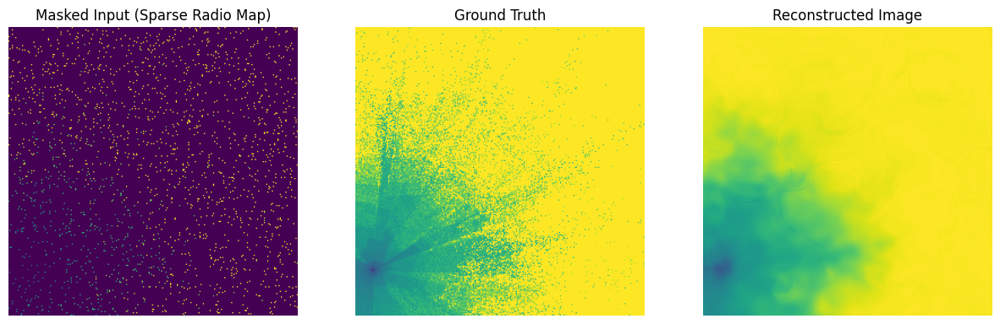

In [9]:
# model = ViGPatchModel(
#     in_channels=3,
#     out_channels=1,
#     embed_dim=64,
#     num_blocks=4,
#     patch_size=16,
#     k=9,
#     drop_path=0.1,
# ).to(device)

model = SpectrumCNN().to(device)

model_path = '/content/drive/MyDrive/CNN_best.pth'
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

print("Model loaded successfully for inference!")
print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

# Test model on local/test/sample_45000.parquet
print("\n--- Testing model on sample_45000.parquet ---")

# Define constants from Local_Loader
WIDTH = 256
HEIGHT = 256
MIN_DB = 30.0
MAX_DB = 140.0
NUM_SAMPLES_LOW = 655
NUM_SAMPLES_HIGH = 6553

# Path to the specific parquet file
specific_file_path = os.path.join('/content/drive/MyDrive/local/test', 'sample_45000.parquet')

if os.path.exists(specific_file_path):
    df = pd.read_parquet(specific_file_path, engine='pyarrow')

    # Reshape channels
    env_map = df['building_mask'].iloc[0].reshape((HEIGHT, WIDTH))
    tx_map = df['tx_origin'].iloc[0].reshape((HEIGHT, WIDTH))
    radio_map = df['path_loss'].iloc[0].reshape((HEIGHT, WIDTH))

    # Create sparsity (around 1% to 10% of original radio map)
    # This logic is copied from Local_Loader for creating sparse input
    num_samples = np.random.randint(NUM_SAMPLES_LOW, NUM_SAMPLES_HIGH)
    sparse_samples = np.zeros((HEIGHT, WIDTH), dtype=np.float32)
    x_samples = np.random.randint(0, WIDTH, size=num_samples)
    y_samples = np.random.randint(0, HEIGHT, size=num_samples)
    sparse_samples[x_samples, y_samples] = radio_map[x_samples, y_samples]

    # Normalize maps
    radio_map_norm = (radio_map - MIN_DB) / (MAX_DB - MIN_DB)
    sparse_samples_norm = np.zeros_like(sparse_samples)
    valid_mask = sparse_samples > 0
    sparse_samples_norm[valid_mask] = (sparse_samples[valid_mask] - MIN_DB) / (MAX_DB - MIN_DB)
    sparse_samples_norm = np.clip(sparse_samples_norm, 0.0, 1.0)

    # Stack tensor for model input
    inputs_np = np.stack([env_map, tx_map, sparse_samples_norm], axis=0)
    target_np = np.expand_dims(radio_map_norm, axis=0)

    # Convert to torch tensors and add batch dimension
    sparse_input_sample = torch.from_numpy(inputs_np).float().unsqueeze(0).to(device)
    original_target_sample = torch.from_numpy(target_np).float().unsqueeze(0).to(device)

    print(f"Loaded {specific_file_path}")
    print(f"Input tensor shape: {sparse_input_sample.shape}")
    print(f"Target tensor shape: {original_target_sample.shape}")

    with torch.no_grad():
        reconstruction = model(sparse_input_sample)

    print(f"Output (reconstruction) tensor shape: {reconstruction.shape}")

    # Calculate losses
    sparse_radio_map_channel = sparse_input_sample[:, 2:3, :, :]
    mask_for_loss = (sparse_radio_map_channel > 0).float() # Create a mask where sparse values exist

    loss_obs = F.mse_loss(reconstruction * mask_for_loss, original_target_sample * mask_for_loss)
    loss_all = F.mse_loss(reconstruction, original_target_sample)

    print(f"MSE on observed (trained model) for sample_45000.parquet: {loss_obs.item():.4f}")
    print(f"MSE on all      (trained model) for sample_45000.parquet: {loss_all.item():.4f}")
else:
    print(f"Error: File not found at {specific_file_path}")

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sparse_radio_map_vis = sparse_input_sample[0, 2, :, :].cpu().numpy()
plt.imshow(sparse_radio_map_vis, cmap="viridis", vmin=0, vmax=1)
plt.title('Masked Input (Sparse Radio Map)')
plt.axis('off')

plt.subplot(1, 3, 2)
original_radio_map_vis = original_target_sample.squeeze(0).squeeze(0).cpu().numpy()
plt.imshow(original_radio_map_vis, cmap="viridis", vmin=0, vmax=1)
plt.title('Ground Truth')
plt.axis('off')

plt.subplot(1, 3, 3)
reconstruction_vis = reconstruction.squeeze(0).squeeze(0).cpu().numpy()
plt.imshow(reconstruction_vis, cmap="viridis", vmin=0, vmax=1)
plt.title('Reconstructed Image')
plt.axis('off')

plt.show()

Random robot_position chosen: (56, 179)
Radius for circular sparsity mask: 2 patches (16 pixels)
Applied random sparsity to 248 points within the circular region.
Input tensor shape for robot-centric mask (cropped): torch.Size([1, 3, 33, 33])
Target tensor shape (cropped): torch.Size([1, 1, 33, 33])
Reconstruction tensor shape (cropped): torch.Size([1, 1, 33, 33])
MSE on observed (robot-centric): 0.0005
MSE on all      (robot-centric): 0.0025


/tmp/ipykernel_21785/1310433455.py:160: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


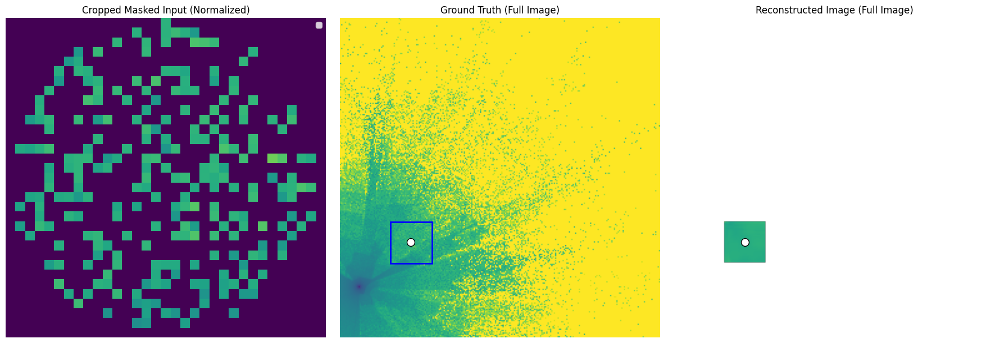

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import os

WIDTH = 256
HEIGHT = 256
MIN_DB = 30.0
MAX_DB = 140.0
PATCH_SIZE = 8

specific_file_path = os.path.join('/content/drive/MyDrive/local/test', 'sample_45000.parquet')

if os.path.exists(specific_file_path):
    df = pd.read_parquet(specific_file_path, engine='pyarrow')

    # Reshape channels to get the ground truth data
    env_map = df['building_mask'].iloc[0].reshape((HEIGHT, WIDTH))
    tx_map = df['tx_origin'].iloc[0].reshape((HEIGHT, WIDTH))
    radio_map = df['path_loss'].iloc[0].reshape((HEIGHT, WIDTH))

    # Normalize ground truth radio map
    radio_map_norm = (radio_map - MIN_DB) / (MAX_DB - MIN_DB)

    robot_x = np.random.randint(0, WIDTH)
    robot_y = np.random.randint(0, HEIGHT)
    robot_position = (robot_x, robot_y)
    print(f"Random robot_position chosen: ({robot_x}, {robot_y})")

    radius_patches = 2
    radius_pixels = radius_patches * PATCH_SIZE
    print(f"Radius for circular sparsity mask: {radius_patches} patches ({radius_pixels} pixels)")

    sparse_samples_robot_centric = np.zeros_like(radio_map, dtype=np.float32)

    # Define the bounding box for the robot's square sensing area
    min_x_square = max(0, robot_x - radius_pixels)
    max_x_square = min(WIDTH, robot_x + radius_pixels + 1)
    min_y_square = max(0, robot_y - radius_pixels)
    max_y_square = min(HEIGHT, robot_y + radius_pixels + 1)

    # Create local coordinates for the square region slice
    Y_local, X_local = np.ogrid[0:(max_y_square - min_y_square), 0:(max_x_square - min_x_square)]

    # Calculate distances from the robot's center (global coordinates) to each point in the local square region
    dist_from_center = np.sqrt((X_local + min_x_square - robot_x)**2 + (Y_local + min_y_square - robot_y)**2)
    circular_mask_local = dist_from_center <= radius_pixels

    # Get local coordinates (within the square region slice) that are inside the circle
    circular_coords_local_y, circular_coords_local_x = np.where(circular_mask_local)

    num_pixels_in_circle = len(circular_coords_local_x)

    if num_pixels_in_circle > 0:
        # Randomly select a percentage of points within the circular region for sparsity
        min_sparse_fraction = 0.1 # 10% of circular points
        max_sparse_fraction = 0.5 # 50% of circular points
        num_sparse_points = np.random.randint(
            int(num_pixels_in_circle * min_sparse_fraction),
            int(num_pixels_in_circle * max_sparse_fraction) + 1
        )
        num_sparse_points = min(num_sparse_points, num_pixels_in_circle) # Ensure not to select more than available

        if num_sparse_points > 0:
            selected_indices = np.random.choice(num_pixels_in_circle, num_sparse_points, replace=False)
            selected_y_local = circular_coords_local_y[selected_indices]
            selected_x_local = circular_coords_local_x[selected_indices]

            # Convert local selected coordinates to global coordinates
            selected_y_global = selected_y_local + min_y_square
            selected_x_global = selected_x_local + min_x_square

            # Populate sparse_samples_robot_centric with radio_map values at selected points
            sparse_samples_robot_centric[selected_y_global, selected_x_global] = \
                radio_map[selected_y_global, selected_x_global]
            print(f"Applied random sparsity to {num_sparse_points} points within the circular region.")
        else:
            print("No sparse points selected in the circular region due to random selection criteria.")
    else:
        print("No pixels found within the circular region to apply sparsity.")

    sparse_samples_robot_centric_norm = np.zeros_like(sparse_samples_robot_centric)
    valid_mask_robot_centric = sparse_samples_robot_centric > 0
    if np.any(valid_mask_robot_centric):
        sparse_samples_robot_centric_norm[valid_mask_robot_centric] = (sparse_samples_robot_centric[valid_mask_robot_centric] - MIN_DB) / (MAX_DB - MIN_DB)
    sparse_samples_robot_centric_norm = np.clip(sparse_samples_robot_centric_norm, 0.0, 1.0)

    # Crop input channels to the defined square patch
    env_map_cropped = env_map[min_y_square:max_y_square, min_x_square:max_x_square]
    tx_map_cropped = tx_map[min_y_square:max_y_square, min_x_square:max_x_square]
    sparse_samples_robot_centric_norm_cropped = sparse_samples_robot_centric_norm[min_y_square:max_y_square, min_x_square:max_x_square]

    # Stack only the cropped parts for model input
    inputs_np_robot_centric_cropped = np.stack([env_map_cropped, tx_map_cropped, sparse_samples_robot_centric_norm_cropped], axis=0)
    sparse_input_sample_robot_centric = torch.from_numpy(inputs_np_robot_centric_cropped).float().unsqueeze(0).to(device)

    # Also crop the ground truth for comparison
    original_target_sample_cropped_np = radio_map_norm[min_y_square:max_y_square, min_x_square:max_x_square]
    original_target_sample_cropped = torch.from_numpy(np.expand_dims(original_target_sample_cropped_np, axis=0)).float().unsqueeze(0).to(device)

    print(f"Input tensor shape for robot-centric mask (cropped): {sparse_input_sample_robot_centric.shape}")
    print(f"Target tensor shape (cropped): {original_target_sample_cropped.shape}")

    model.eval()
    with torch.no_grad():
        # Get original cropped dimensions for cropping the output later
        _, _, H_cropped, W_cropped = sparse_input_sample_robot_centric.shape

        # Determine padding needed for the model (multiple of 8 for 3 pooling layers)
        pad_H = (8 - H_cropped % 8) % 8
        pad_W = (8 - W_cropped % 8) % 8

        # Apply padding to the input tensor
        # F.pad expects (pad_left, pad_right, pad_top, pad_bottom)
        padded_input = F.pad(sparse_input_sample_robot_centric, (0, pad_W, 0, pad_H))

        reconstruction_robot_centric = model(padded_input)

        # Crop the output back to the original cropped dimensions
        reconstruction_robot_centric = reconstruction_robot_centric[:, :, :H_cropped, :W_cropped]

    print(f"Reconstruction tensor shape (cropped): {reconstruction_robot_centric.shape}")

    # Calculate losses for the robot-centric reconstruction (using cropped targets)
    mask_for_loss_robot_centric = (sparse_input_sample_robot_centric[:, 2:3, :, :] > 0).float()
    loss_obs_robot_centric = F.mse_loss(reconstruction_robot_centric * mask_for_loss_robot_centric, original_target_sample_cropped * mask_for_loss_robot_centric)
    loss_all_robot_centric = F.mse_loss(reconstruction_robot_centric, original_target_sample_cropped)

    print(f"MSE on observed (robot-centric): {loss_obs_robot_centric.item():.4f}")
    print(f"MSE on all      (robot-centric): {loss_all_robot_centric.item():.4f}")


    def denormalize_radio_map(tensor, min_db=30.0, max_db=140.0):
        denormalized = tensor * (max_db - min_db) + min_db
        return denormalized

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    # Display the cropped sparse input directly from the model input tensor
    plt.imshow(sparse_input_sample_robot_centric[0, 2, :, :].cpu().numpy(), cmap="viridis", vmin=0, vmax=1)
    # Add a circle outline to show the actual circular sensing area in the cropped view
    # The circle's center and radius need to be relative to the cropped image
    rel_robot_x = robot_x - min_x_square
    rel_robot_y = robot_y - min_y_square
    circle_patch_cropped = plt.Circle((rel_robot_x, rel_robot_y), radius_pixels, color='red', fill=False, linewidth=2, label='Circular Sensing Area')
    #plt.gca().add_patch(circle_patch_cropped)

    # Add a square outline for the bounding patch in the cropped view
    square_width = max_x_square - min_x_square
    square_height = max_y_square - min_y_square
    square_patch_cropped = plt.Rectangle((0, 0), square_width, square_height,
                                 edgecolor='blue', fill=False, linewidth=2, label='Square Patch Boundary')
    #plt.gca().add_patch(square_patch_cropped)

    plt.title('Cropped Masked Input (Normalized)')
    plt.axis('off')
    plt.legend(loc='upper right')

    plt.subplot(1, 3, 2)
    # Display the full ground truth
    plt.imshow(radio_map_norm, cmap="viridis", vmin=0, vmax=1)
    plt.scatter(robot_x, robot_y, color='white', s=100, marker='o', edgecolors='black', linewidth=1)
    # Add global circle and square outlines to the full ground truth map
    circle_patch_global = plt.Circle((robot_x, robot_y), radius_pixels, color='red', fill=False, linewidth=2, label='Circular Sensing Area')
    #plt.gca().add_patch(circle_patch_global)
    square_patch_global = plt.Rectangle((min_x_square, min_y_square), square_width, square_height,
                                 edgecolor='blue', fill=False, linewidth=2, label='Square Patch Boundary')
    plt.gca().add_patch(square_patch_global)
    plt.title('Ground Truth (Full Image)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    # Create a blank full-size image and 'paste' the reconstruction into it
    full_reconstruction_map = np.full((HEIGHT, WIDTH), np.nan) # Use NaN for empty areas
    reconstruction_vis = reconstruction_robot_centric.squeeze(0).squeeze(0).cpu().numpy()
    full_reconstruction_map[min_y_square:max_y_square, min_x_square:max_x_square] = reconstruction_vis

    plt.imshow(full_reconstruction_map, cmap="viridis", vmin=0, vmax=1)
    plt.scatter(robot_x, robot_y, color='white', s=100, marker='o', edgecolors='black', linewidth=1)
    # Add global circle and square outlines to the full reconstructed map
    #plt.gca().add_patch(plt.Circle((robot_x, robot_y), radius_pixels, color='red', fill=False, linewidth=2))
    #plt.gca().add_patch(plt.Rectangle((min_x_square, min_y_square), square_width, square_height,
                                 #edgecolor='blue', fill=False, linewidth=2))
    plt.title('Reconstructed Image (Full Image)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

else:
    print(f"Error: File not found at {specific_file_path}")

Random robot_position chosen: (251, 87)
Radius for circular sparsity mask: 2 patches (16 pixels)
Applied random sparsity to 97 points within the circular region.
Input tensor shape for robot-centric mask (cropped): torch.Size([1, 3, 33, 21])
Target tensor shape (cropped): torch.Size([1, 1, 33, 21])
Reconstruction tensor shape (cropped): torch.Size([1, 1, 33, 21])
MSE on observed (robot-centric): 0.0002
MSE on all      (robot-centric): 0.0015


/tmp/ipykernel_21785/1310433455.py:160: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


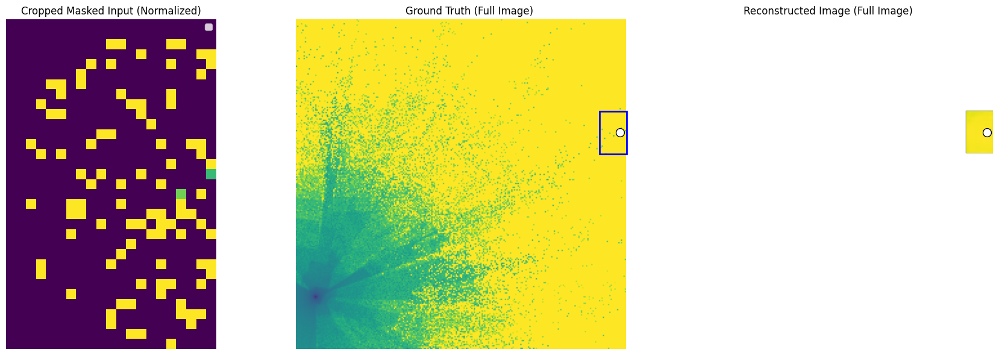

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import os

WIDTH = 256
HEIGHT = 256
MIN_DB = 30.0
MAX_DB = 140.0
PATCH_SIZE = 8

specific_file_path = os.path.join('/content/drive/MyDrive/local/test', 'sample_45000.parquet')

if os.path.exists(specific_file_path):
    df = pd.read_parquet(specific_file_path, engine='pyarrow')

    # Reshape channels to get the ground truth data
    env_map = df['building_mask'].iloc[0].reshape((HEIGHT, WIDTH))
    tx_map = df['tx_origin'].iloc[0].reshape((HEIGHT, WIDTH))
    radio_map = df['path_loss'].iloc[0].reshape((HEIGHT, WIDTH))

    # Normalize ground truth radio map
    radio_map_norm = (radio_map - MIN_DB) / (MAX_DB - MIN_DB)

    robot_x = np.random.randint(0, WIDTH)
    robot_y = np.random.randint(0, HEIGHT)
    robot_position = (robot_x, robot_y)
    print(f"Random robot_position chosen: ({robot_x}, {robot_y})")

    radius_patches = 2
    radius_pixels = radius_patches * PATCH_SIZE
    print(f"Radius for circular sparsity mask: {radius_patches} patches ({radius_pixels} pixels)")

    sparse_samples_robot_centric = np.zeros_like(radio_map, dtype=np.float32)

    # Define the bounding box for the robot's square sensing area
    min_x_square = max(0, robot_x - radius_pixels)
    max_x_square = min(WIDTH, robot_x + radius_pixels + 1)
    min_y_square = max(0, robot_y - radius_pixels)
    max_y_square = min(HEIGHT, robot_y + radius_pixels + 1)

    # Create local coordinates for the square region slice
    Y_local, X_local = np.ogrid[0:(max_y_square - min_y_square), 0:(max_x_square - min_x_square)]

    # Calculate distances from the robot's center (global coordinates) to each point in the local square region
    dist_from_center = np.sqrt((X_local + min_x_square - robot_x)**2 + (Y_local + min_y_square - robot_y)**2)
    circular_mask_local = dist_from_center <= radius_pixels

    # Get local coordinates (within the square region slice) that are inside the circle
    circular_coords_local_y, circular_coords_local_x = np.where(circular_mask_local)

    num_pixels_in_circle = len(circular_coords_local_x)

    if num_pixels_in_circle > 0:
        # Randomly select a percentage of points within the circular region for sparsity
        min_sparse_fraction = 0.1 # 10% of circular points
        max_sparse_fraction = 0.5 # 50% of circular points
        num_sparse_points = np.random.randint(
            int(num_pixels_in_circle * min_sparse_fraction),
            int(num_pixels_in_circle * max_sparse_fraction) + 1
        )
        num_sparse_points = min(num_sparse_points, num_pixels_in_circle) # Ensure not to select more than available

        if num_sparse_points > 0:
            selected_indices = np.random.choice(num_pixels_in_circle, num_sparse_points, replace=False)
            selected_y_local = circular_coords_local_y[selected_indices]
            selected_x_local = circular_coords_local_x[selected_indices]

            # Convert local selected coordinates to global coordinates
            selected_y_global = selected_y_local + min_y_square
            selected_x_global = selected_x_local + min_x_square

            # Populate sparse_samples_robot_centric with radio_map values at selected points
            sparse_samples_robot_centric[selected_y_global, selected_x_global] = \
                radio_map[selected_y_global, selected_x_global]
            print(f"Applied random sparsity to {num_sparse_points} points within the circular region.")
        else:
            print("No sparse points selected in the circular region due to random selection criteria.")
    else:
        print("No pixels found within the circular region to apply sparsity.")

    sparse_samples_robot_centric_norm = np.zeros_like(sparse_samples_robot_centric)
    valid_mask_robot_centric = sparse_samples_robot_centric > 0
    if np.any(valid_mask_robot_centric):
        sparse_samples_robot_centric_norm[valid_mask_robot_centric] = (sparse_samples_robot_centric[valid_mask_robot_centric] - MIN_DB) / (MAX_DB - MIN_DB)
    sparse_samples_robot_centric_norm = np.clip(sparse_samples_robot_centric_norm, 0.0, 1.0)

    # Crop input channels to the defined square patch
    env_map_cropped = env_map[min_y_square:max_y_square, min_x_square:max_x_square]
    tx_map_cropped = tx_map[min_y_square:max_y_square, min_x_square:max_x_square]
    sparse_samples_robot_centric_norm_cropped = sparse_samples_robot_centric_norm[min_y_square:max_y_square, min_x_square:max_x_square]

    # Stack only the cropped parts for model input
    inputs_np_robot_centric_cropped = np.stack([env_map_cropped, tx_map_cropped, sparse_samples_robot_centric_norm_cropped], axis=0)
    sparse_input_sample_robot_centric = torch.from_numpy(inputs_np_robot_centric_cropped).float().unsqueeze(0).to(device)

    # Also crop the ground truth for comparison
    original_target_sample_cropped_np = radio_map_norm[min_y_square:max_y_square, min_x_square:max_x_square]
    original_target_sample_cropped = torch.from_numpy(np.expand_dims(original_target_sample_cropped_np, axis=0)).float().unsqueeze(0).to(device)

    print(f"Input tensor shape for robot-centric mask (cropped): {sparse_input_sample_robot_centric.shape}")
    print(f"Target tensor shape (cropped): {original_target_sample_cropped.shape}")

    model.eval()
    with torch.no_grad():
        # Get original cropped dimensions for cropping the output later
        _, _, H_cropped, W_cropped = sparse_input_sample_robot_centric.shape

        # Determine padding needed for the model (multiple of 8 for 3 pooling layers)
        pad_H = (8 - H_cropped % 8) % 8
        pad_W = (8 - W_cropped % 8) % 8

        # Apply padding to the input tensor
        # F.pad expects (pad_left, pad_right, pad_top, pad_bottom)
        padded_input = F.pad(sparse_input_sample_robot_centric, (0, pad_W, 0, pad_H))

        reconstruction_robot_centric = model(padded_input)

        # Crop the output back to the original cropped dimensions
        reconstruction_robot_centric = reconstruction_robot_centric[:, :, :H_cropped, :W_cropped]

    print(f"Reconstruction tensor shape (cropped): {reconstruction_robot_centric.shape}")

    # Calculate losses for the robot-centric reconstruction (using cropped targets)
    mask_for_loss_robot_centric = (sparse_input_sample_robot_centric[:, 2:3, :, :] > 0).float()
    loss_obs_robot_centric = F.mse_loss(reconstruction_robot_centric * mask_for_loss_robot_centric, original_target_sample_cropped * mask_for_loss_robot_centric)
    loss_all_robot_centric = F.mse_loss(reconstruction_robot_centric, original_target_sample_cropped)

    print(f"MSE on observed (robot-centric): {loss_obs_robot_centric.item():.4f}")
    print(f"MSE on all      (robot-centric): {loss_all_robot_centric.item():.4f}")


    def denormalize_radio_map(tensor, min_db=30.0, max_db=140.0):
        denormalized = tensor * (max_db - min_db) + min_db
        return denormalized

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    # Display the cropped sparse input directly from the model input tensor
    plt.imshow(sparse_input_sample_robot_centric[0, 2, :, :].cpu().numpy(), cmap="viridis", vmin=0, vmax=1)
    # Add a circle outline to show the actual circular sensing area in the cropped view
    # The circle's center and radius need to be relative to the cropped image
    rel_robot_x = robot_x - min_x_square
    rel_robot_y = robot_y - min_y_square
    circle_patch_cropped = plt.Circle((rel_robot_x, rel_robot_y), radius_pixels, color='red', fill=False, linewidth=2, label='Circular Sensing Area')
    #plt.gca().add_patch(circle_patch_cropped)

    # Add a square outline for the bounding patch in the cropped view
    square_width = max_x_square - min_x_square
    square_height = max_y_square - min_y_square
    square_patch_cropped = plt.Rectangle((0, 0), square_width, square_height,
                                 edgecolor='blue', fill=False, linewidth=2, label='Square Patch Boundary')
    #plt.gca().add_patch(square_patch_cropped)

    plt.title('Cropped Masked Input (Normalized)')
    plt.axis('off')
    plt.legend(loc='upper right')

    plt.subplot(1, 3, 2)
    # Display the full ground truth
    plt.imshow(radio_map_norm, cmap="viridis", vmin=0, vmax=1)
    plt.scatter(robot_x, robot_y, color='white', s=100, marker='o', edgecolors='black', linewidth=1)
    # Add global circle and square outlines to the full ground truth map
    circle_patch_global = plt.Circle((robot_x, robot_y), radius_pixels, color='red', fill=False, linewidth=2, label='Circular Sensing Area')
    #plt.gca().add_patch(circle_patch_global)
    square_patch_global = plt.Rectangle((min_x_square, min_y_square), square_width, square_height,
                                 edgecolor='blue', fill=False, linewidth=2, label='Square Patch Boundary')
    plt.gca().add_patch(square_patch_global)
    plt.title('Ground Truth (Full Image)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    # Create a blank full-size image and 'paste' the reconstruction into it
    full_reconstruction_map = np.full((HEIGHT, WIDTH), np.nan) # Use NaN for empty areas
    reconstruction_vis = reconstruction_robot_centric.squeeze(0).squeeze(0).cpu().numpy()
    full_reconstruction_map[min_y_square:max_y_square, min_x_square:max_x_square] = reconstruction_vis

    plt.imshow(full_reconstruction_map, cmap="viridis", vmin=0, vmax=1)
    plt.scatter(robot_x, robot_y, color='white', s=100, marker='o', edgecolors='black', linewidth=1)
    # Add global circle and square outlines to the full reconstructed map
    #plt.gca().add_patch(plt.Circle((robot_x, robot_y), radius_pixels, color='red', fill=False, linewidth=2))
    #plt.gca().add_patch(plt.Rectangle((min_x_square, min_y_square), square_width, square_height,
                                 #edgecolor='blue', fill=False, linewidth=2))
    plt.title('Reconstructed Image (Full Image)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

else:
    print(f"Error: File not found at {specific_file_path}")

Robot start: (104, 240)

Step 1
UP: predicted strongest signal = 111.68 dB
DOWN: predicted strongest signal = 108.03 dB
LEFT: predicted strongest signal = 108.30 dB
RIGHT: predicted strongest signal = 113.93 dB

Chosen direction: DOWN
Predicted strongest signal: 107.56 dB

Robot moving DOWN
New position: (104, 248)
Predicted signal: 108.03 dB

Step 2
UP: predicted strongest signal = 108.50 dB
LEFT: predicted strongest signal = 105.27 dB
RIGHT: predicted strongest signal = 115.76 dB

Chosen direction: LEFT
Predicted strongest signal: 103.77 dB

Robot moving LEFT
New position: (96, 248)
Predicted signal: 105.27 dB

Step 3
UP: predicted strongest signal = 111.47 dB
LEFT: predicted strongest signal = 104.67 dB
RIGHT: predicted strongest signal = 111.21 dB

Chosen direction: LEFT
Predicted strongest signal: 104.35 dB

Robot moving LEFT
New position: (88, 248)
Predicted signal: 104.67 dB

Step 4
UP: predicted strongest signal = 103.53 dB
LEFT: predicted strongest signal = 97.44 dB
RIGHT: pre

/tmp/ipykernel_21785/1057608848.py:261: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(



Robot moving UP
New position: (24, 208)
Predicted signal: 55.26 dB

Step 23
UP: predicted strongest signal = 56.04 dB
DOWN: predicted strongest signal = 59.02 dB
LEFT: predicted strongest signal = 54.61 dB
RIGHT: predicted strongest signal = 70.29 dB

Chosen direction: LEFT
Predicted strongest signal: 54.87 dB

Robot moving LEFT
New position: (16, 208)
Predicted signal: 54.61 dB

Step 24
UP: predicted strongest signal = 60.76 dB
DOWN: predicted strongest signal = 58.10 dB
LEFT: predicted strongest signal = 55.88 dB
RIGHT: predicted strongest signal = 59.23 dB

Chosen direction: LEFT
Predicted strongest signal: 56.48 dB

Robot moving LEFT
New position: (8, 208)
Predicted signal: 55.88 dB

Step 25
UP: predicted strongest signal = 67.54 dB
DOWN: predicted strongest signal = 60.50 dB
LEFT: predicted strongest signal = 65.50 dB
RIGHT: predicted strongest signal = 56.90 dB

Chosen direction: RIGHT
Predicted strongest signal: 57.74 dB

Robot moving RIGHT
New position: (16, 208)
Predicted sig

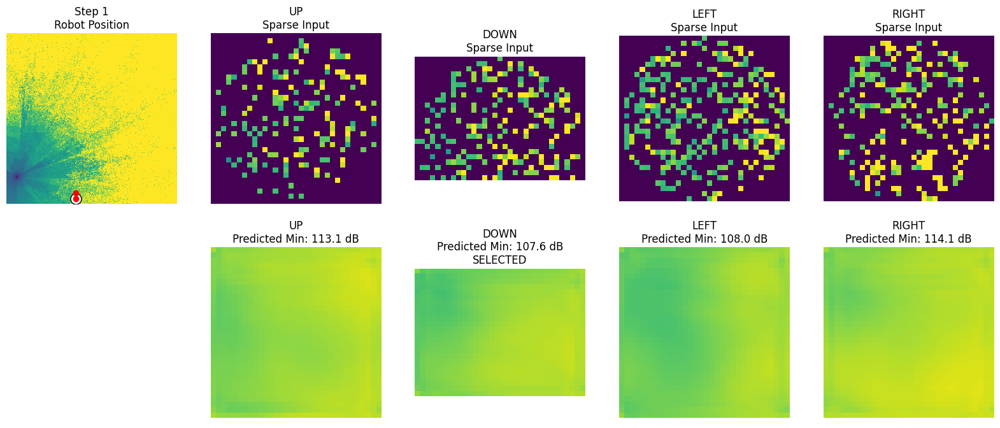

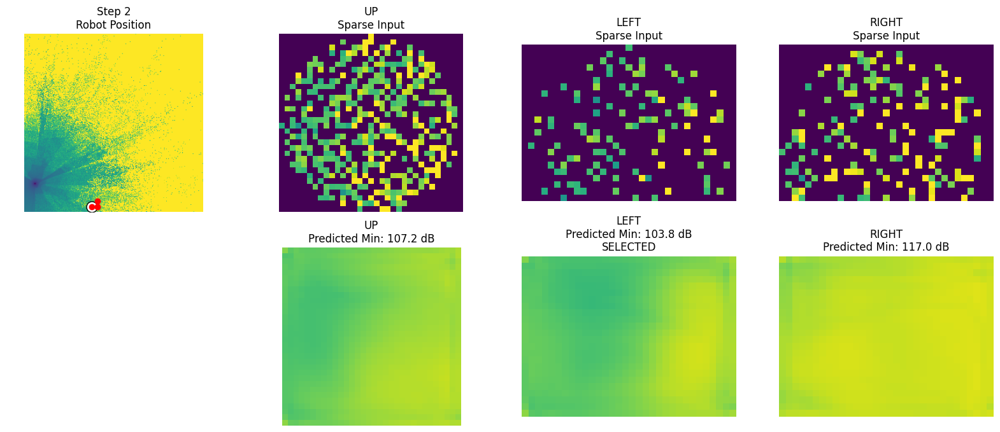

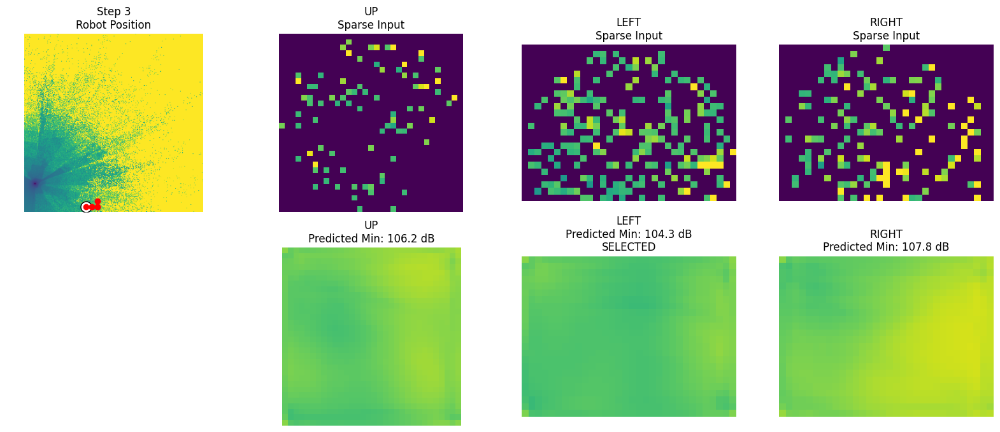

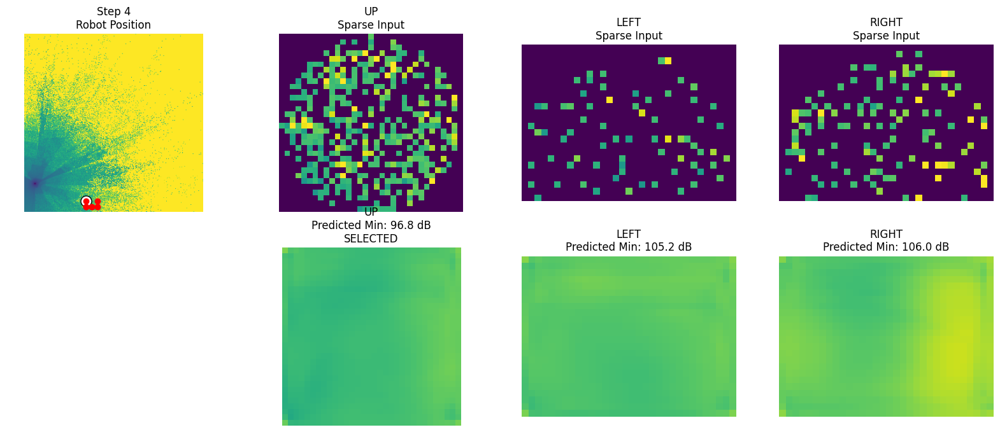

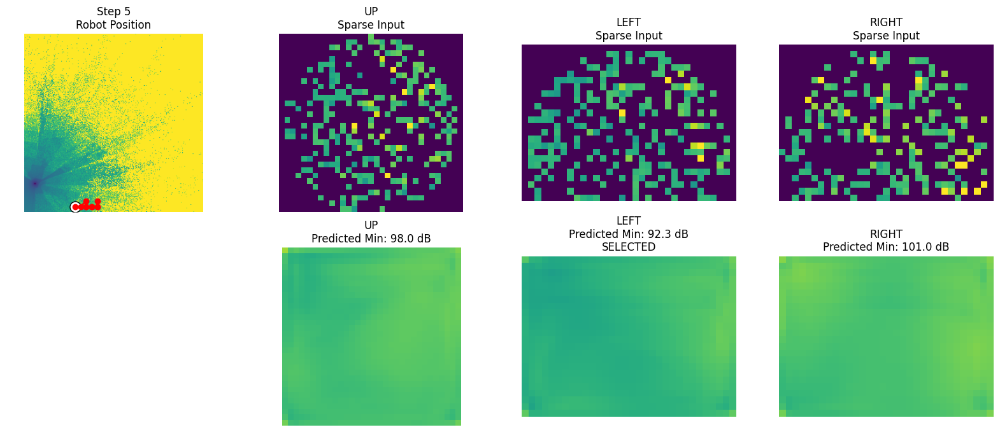

...

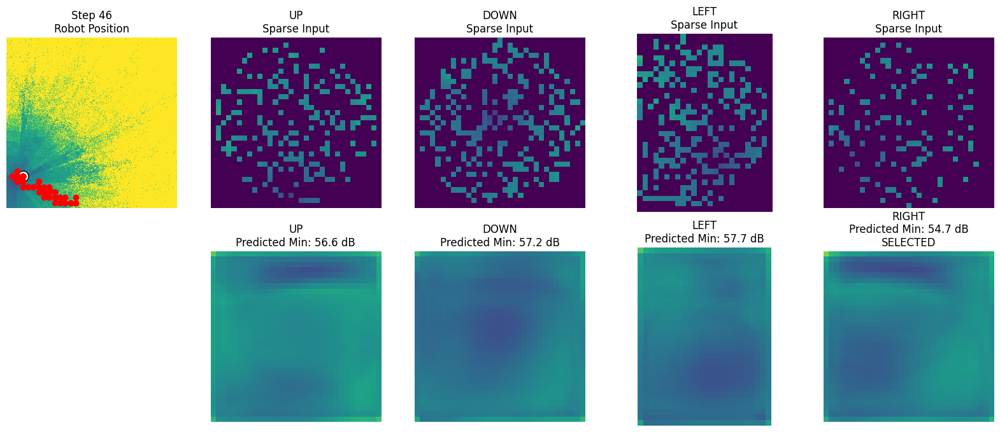

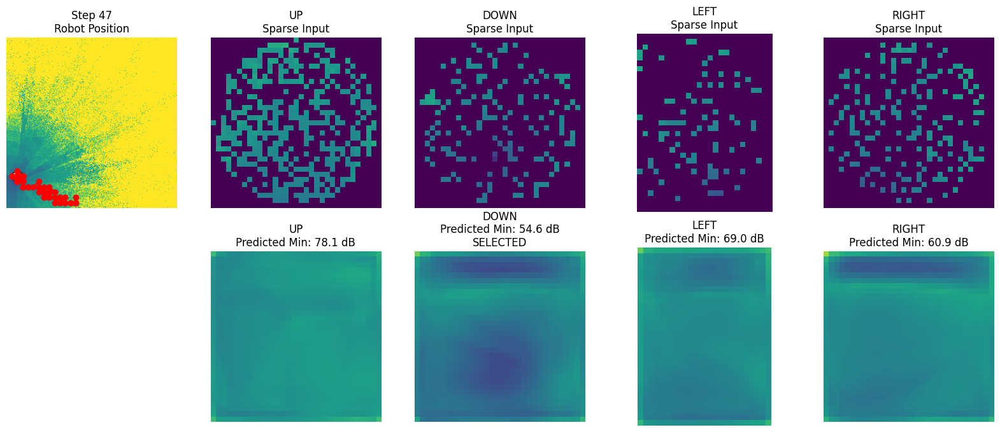

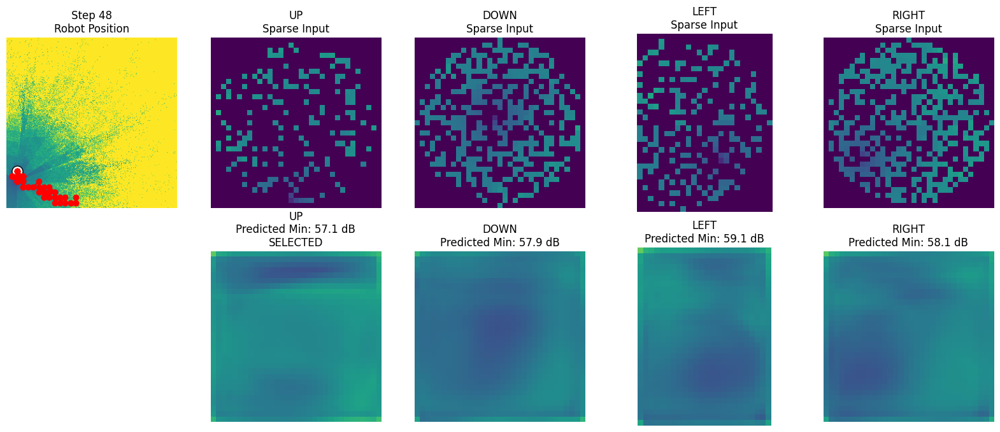

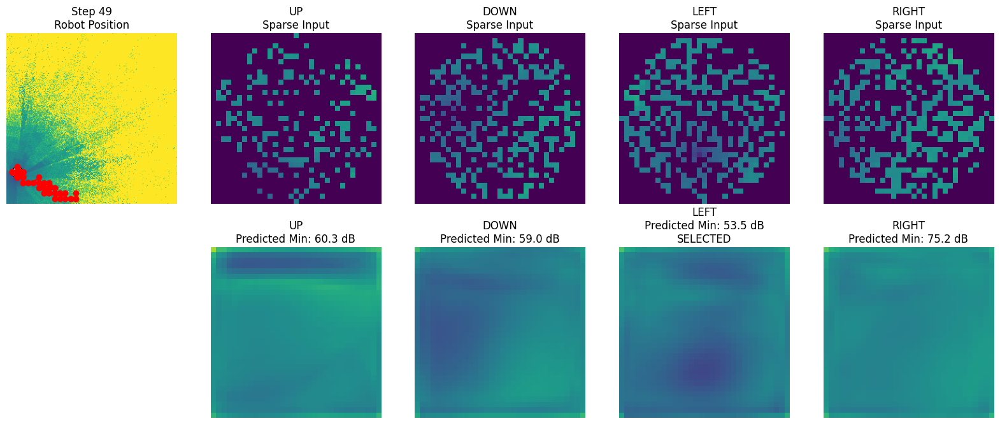

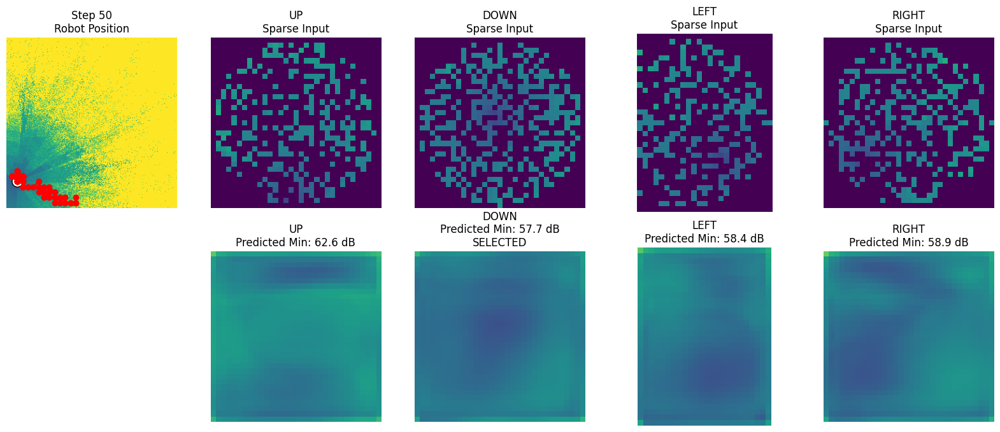

In [12]:
            "direction": direction,

            "position": (new_x, new_y),

            "score": score,

            "reconstruction": reconstruction_db,

            "sparse_input": sparse_input,

            "bounds": (
                min_x,
                max_x,
                min_y,
                max_y
            )
        })

    best_item = min(
        direction_visualizations,
        key=lambda x: x["score"]
    )

    best_direction = best_item["direction"]

    trajectory.append(best_item["position"])

    print(
        f"\nChosen direction: {best_direction}"
    )

    print(
        f"Predicted strongest signal: "
        f"{best_item['score']:.2f} dB"
    )

# Visualization

    fig, axes = plt.subplots(
        2,
        len(direction_visualizations) + 1,
        figsize=(20, 8)
    )

    # Full Map
    axes[0,0].imshow(
        radio_map,
        cmap='viridis'
    )

    traj = np.array(trajectory)

    axes[0,0].plot(
        traj[:,0],
        traj[:,1],
        color='red',
        marker='o',
        linewidth=2
    )

    # Plot current robot position (before moving to best_position)
    axes[0,0].scatter(
        robot_x,
        robot_y,
        c='white',
        s=150,
        edgecolors='black'
    )

    axes[0,0].set_title(
        f"Step {step+1}\nRobot Position"
    )

    axes[0,0].axis('off')

    # Empty lower-left panel
    axes[1,0].axis('off')


    for idx, item in enumerate(direction_visualizations):

        direction = item["direction"]

        score = item["score"]

        sparse_input = item["sparse_input"]

        reconstruction = item["reconstruction"]

        min_x, max_x, min_y, max_y = item["bounds"]

        # Sparse measurements

        axes[0, idx+1].imshow(
            sparse_input,
            cmap='viridis',
            vmin=0,
            vmax=1
        )

        axes[0, idx+1].set_title(
            f"{direction}\nSparse Input"
        )

        axes[0, idx+1].axis('off')

        # Reconstruction

        im = axes[1, idx+1].imshow(
            reconstruction,
            cmap='viridis',
            vmin=30,
            vmax=140
        )

        title = (
            f"{direction}\n"
            f"Predicted Min: {score:.1f} dB"
        )

        if direction == best_direction:
            title += "\nSELECTED"

        axes[1, idx+1].set_title(title)

        axes[1, idx+1].axis('off')


    # MOVE ROBOT
    # Update robot_x and robot_y to the best_position found for the next iteration
    robot_x, robot_y = best_position

    print(
        f"\nRobot moving {best_direction}"
    )

    print(
        f"New position: ({robot_x}, {robot_y})"
    )

    print(
        f"Predicted signal: {best_score:.2f} dB"
    )

    # Stop Condition
    if best_score <= TARGET_DB:

        print("\nTarget Signal Found.")

        break

Robot start: (247, 151)

Step 1
UP: predicted strongest signal = 114.54 dB
DOWN: predicted strongest signal = 131.45 dB
LEFT: predicted strongest signal = 108.00 dB

Chosen direction: LEFT
Predicted strongest signal: 108.00 dB


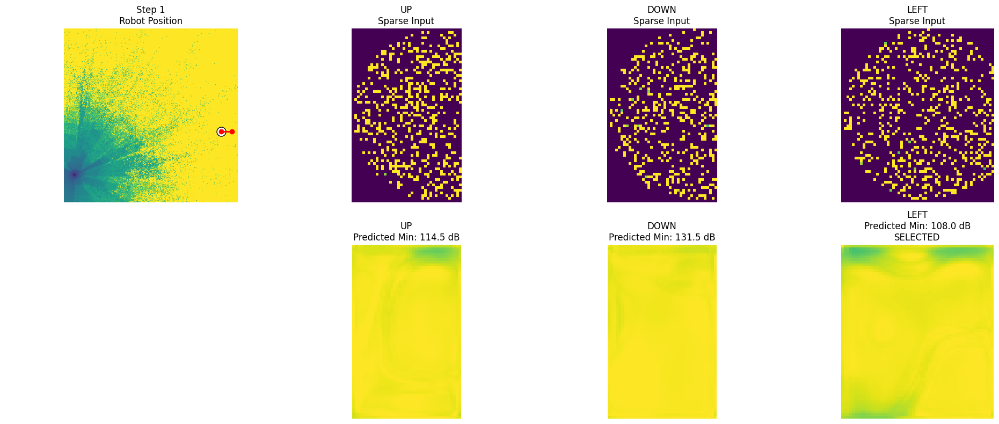


Robot moving LEFT
New position: (231, 151)
Predicted signal: 108.00 dB

Step 2
UP: predicted strongest signal = 115.70 dB
DOWN: predicted strongest signal = 107.88 dB
LEFT: predicted strongest signal = 114.23 dB
RIGHT: predicted strongest signal = 112.36 dB

Chosen direction: DOWN
Predicted strongest signal: 107.88 dB


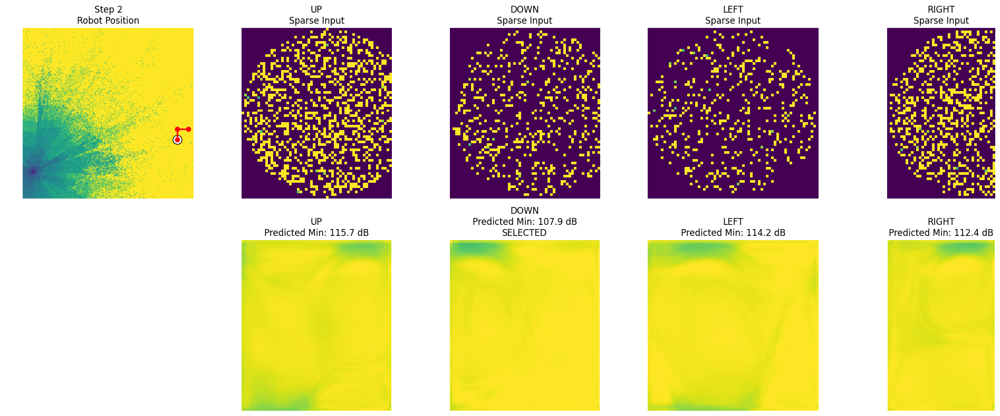


Robot moving DOWN
New position: (231, 167)
Predicted signal: 107.88 dB

Step 3
UP: cached strongest signal = 108.00 dB
DOWN: predicted strongest signal = 102.41 dB
LEFT: predicted strongest signal = 106.67 dB
RIGHT: cached strongest signal = 131.45 dB

Chosen direction: DOWN
Predicted strongest signal: 102.41 dB


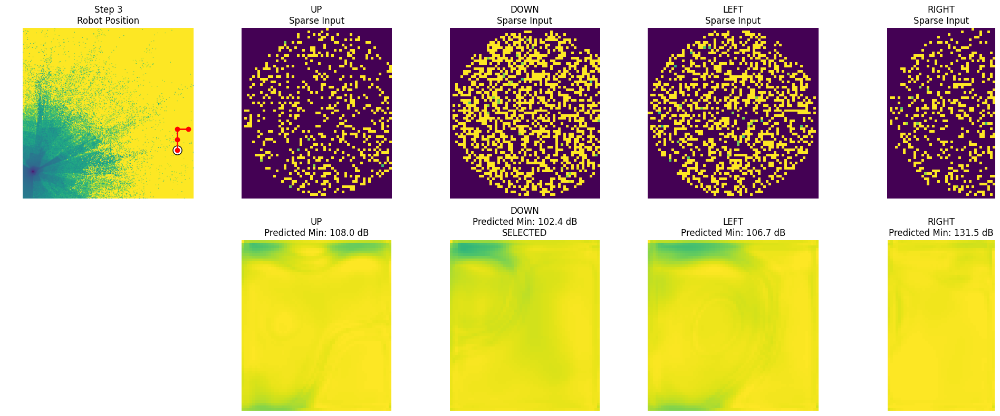


Robot moving DOWN
New position: (231, 183)
Predicted signal: 102.41 dB

Step 4
UP: cached strongest signal = 107.88 dB
DOWN: predicted strongest signal = 108.21 dB
LEFT: predicted strongest signal = 110.95 dB
RIGHT: predicted strongest signal = 125.44 dB

Chosen direction: UP
Predicted strongest signal: 107.88 dB


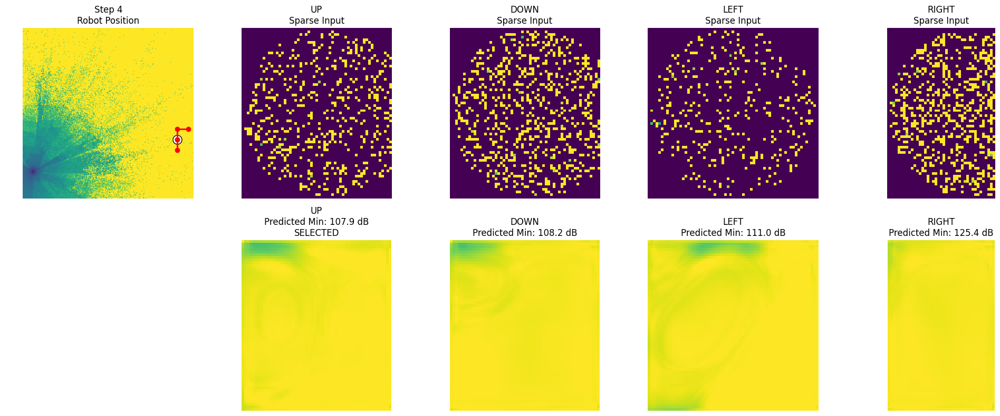


Robot moving UP
New position: (231, 167)
Predicted signal: 107.88 dB

Step 5
UP: cached strongest signal = 108.00 dB
DOWN: cached strongest signal = 102.41 dB
LEFT: cached strongest signal = 106.67 dB
RIGHT: cached strongest signal = 131.45 dB

Chosen direction: DOWN
Predicted strongest signal: 102.41 dB


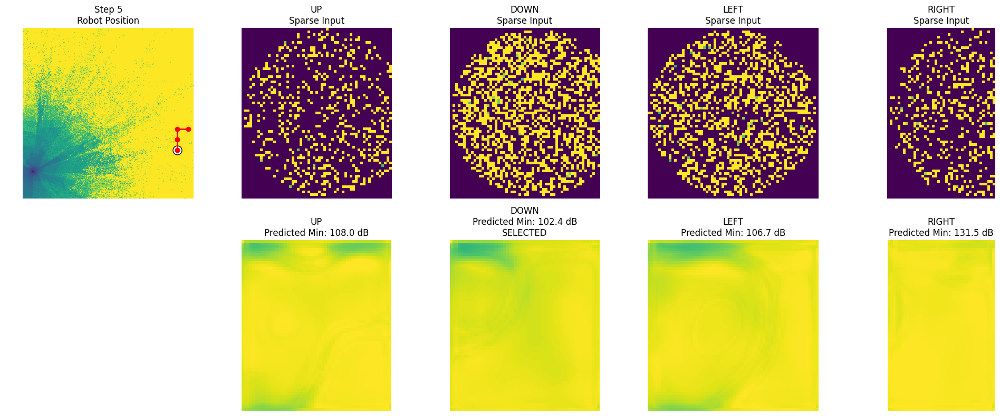


Robot moving DOWN
New position: (231, 183)
Predicted signal: 102.41 dB

Step 6
Skipping UP to (231, 167) - already visited twice.
DOWN: cached strongest signal = 108.21 dB
LEFT: cached strongest signal = 110.95 dB
RIGHT: cached strongest signal = 125.44 dB

Chosen direction: DOWN
Predicted strongest signal: 108.21 dB


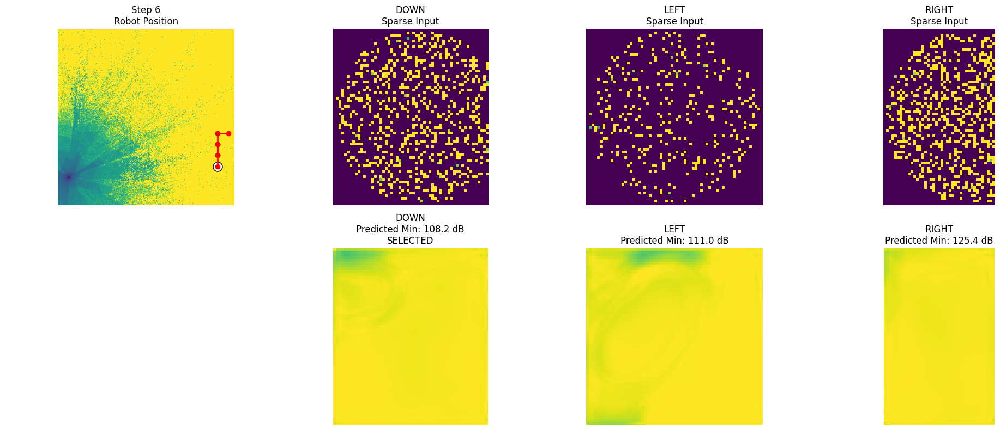


Robot moving DOWN
New position: (231, 199)
Predicted signal: 108.21 dB

Step 7
Skipping UP to (231, 183) - already visited twice.
DOWN: predicted strongest signal = 125.94 dB
LEFT: predicted strongest signal = 116.57 dB
RIGHT: predicted strongest signal = 130.98 dB

Chosen direction: LEFT
Predicted strongest signal: 116.57 dB


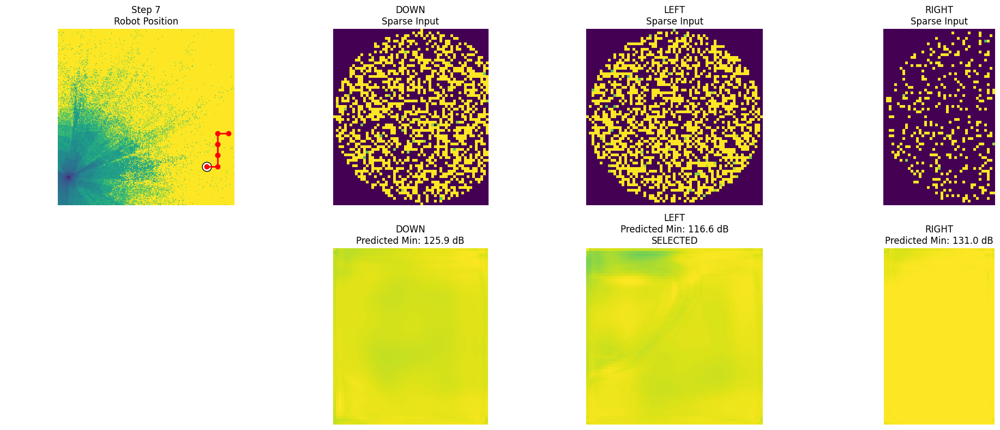


Robot moving LEFT
New position: (215, 199)
Predicted signal: 116.57 dB

Step 8
UP: cached strongest signal = 110.95 dB
DOWN: predicted strongest signal = 107.74 dB
LEFT: predicted strongest signal = 106.39 dB
RIGHT: cached strongest signal = 108.21 dB

Chosen direction: LEFT
Predicted strongest signal: 106.39 dB


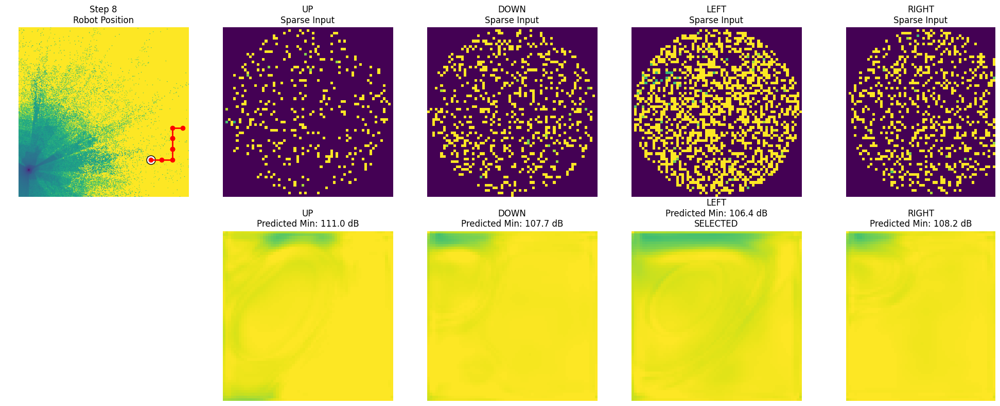


Robot moving LEFT
New position: (199, 199)
Predicted signal: 106.39 dB

Step 9
UP: predicted strongest signal = 109.26 dB
DOWN: predicted strongest signal = 105.62 dB
LEFT: predicted strongest signal = 104.86 dB
RIGHT: cached strongest signal = 116.57 dB

Chosen direction: LEFT
Predicted strongest signal: 104.86 dB


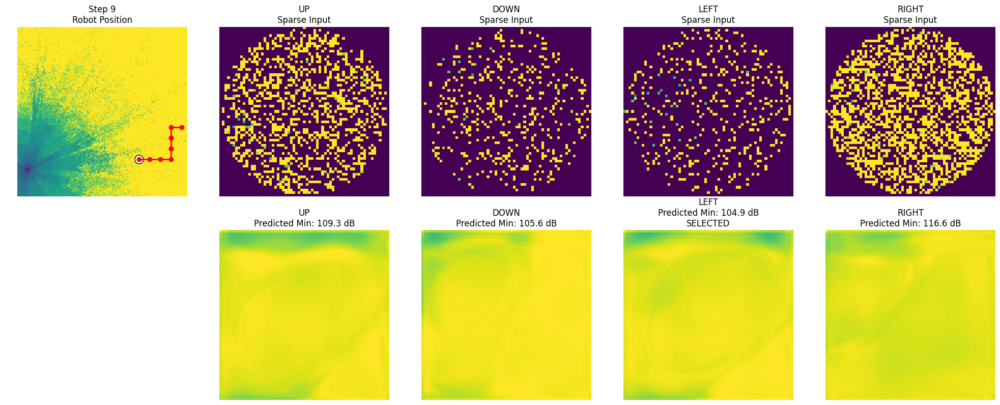


Robot moving LEFT
New position: (183, 199)
Predicted signal: 104.86 dB

Step 10
UP: predicted strongest signal = 112.01 dB
DOWN: predicted strongest signal = 108.99 dB
LEFT: predicted strongest signal = 104.59 dB
RIGHT: cached strongest signal = 106.39 dB

Chosen direction: LEFT
Predicted strongest signal: 104.59 dB


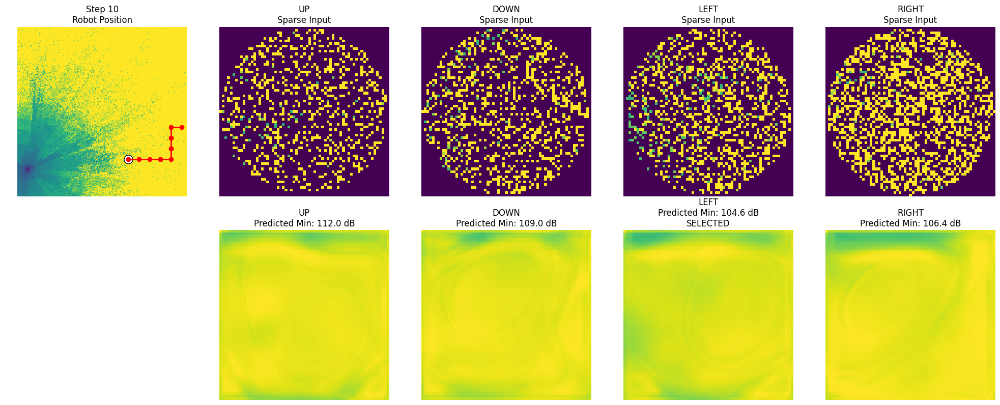


Robot moving LEFT
New position: (167, 199)
Predicted signal: 104.59 dB

Step 11
UP: predicted strongest signal = 103.66 dB
DOWN: predicted strongest signal = 110.81 dB
LEFT: predicted strongest signal = 93.15 dB
RIGHT: cached strongest signal = 104.86 dB

Chosen direction: LEFT
Predicted strongest signal: 93.15 dB


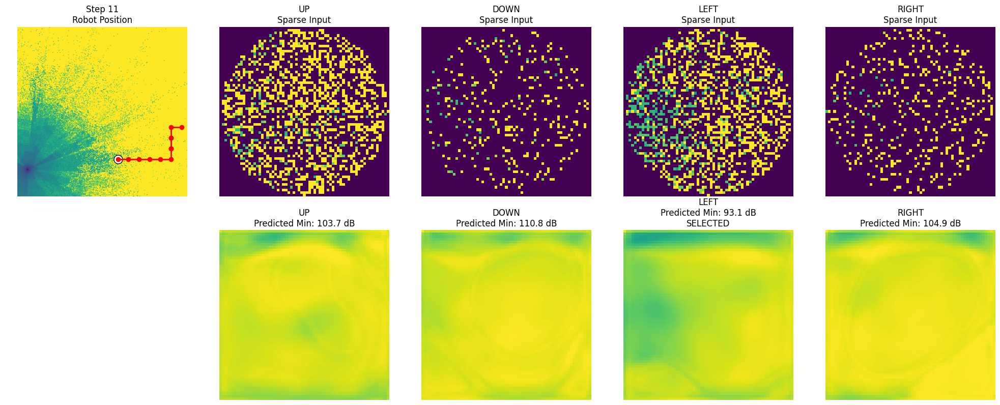


Robot moving LEFT
New position: (151, 199)
Predicted signal: 93.15 dB

Step 12
UP: predicted strongest signal = 101.53 dB
DOWN: predicted strongest signal = 91.78 dB
LEFT: predicted strongest signal = 86.21 dB
RIGHT: cached strongest signal = 104.59 dB

Chosen direction: LEFT
Predicted strongest signal: 86.21 dB


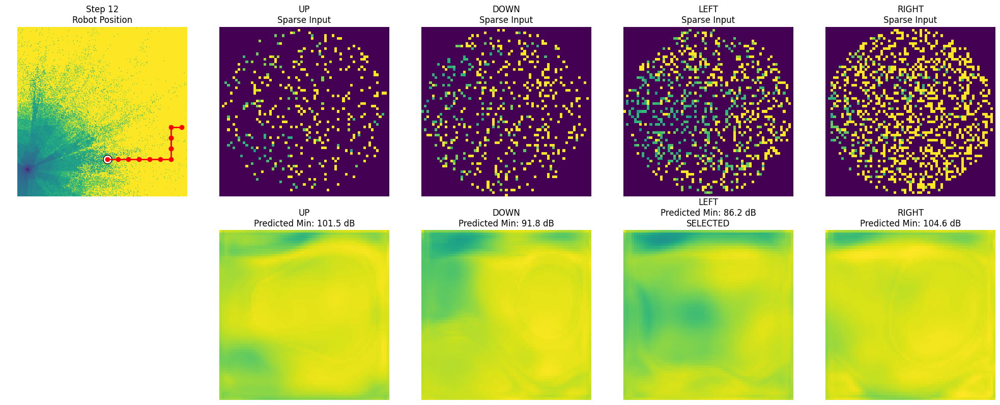


Robot moving LEFT
New position: (135, 199)
Predicted signal: 86.21 dB

Step 13
UP: predicted strongest signal = 104.84 dB
DOWN: predicted strongest signal = 104.72 dB
LEFT: predicted strongest signal = 82.37 dB
RIGHT: cached strongest signal = 93.15 dB

Chosen direction: LEFT
Predicted strongest signal: 82.37 dB


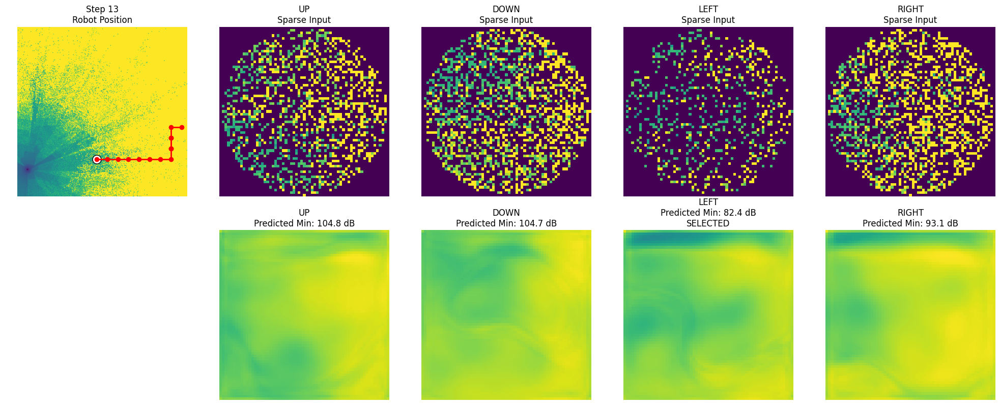


Robot moving LEFT
New position: (119, 199)
Predicted signal: 82.37 dB

Step 14
UP: predicted strongest signal = 83.87 dB
DOWN: predicted strongest signal = 93.28 dB
LEFT: predicted strongest signal = 67.95 dB
RIGHT: cached strongest signal = 86.21 dB

Chosen direction: LEFT
Predicted strongest signal: 67.95 dB


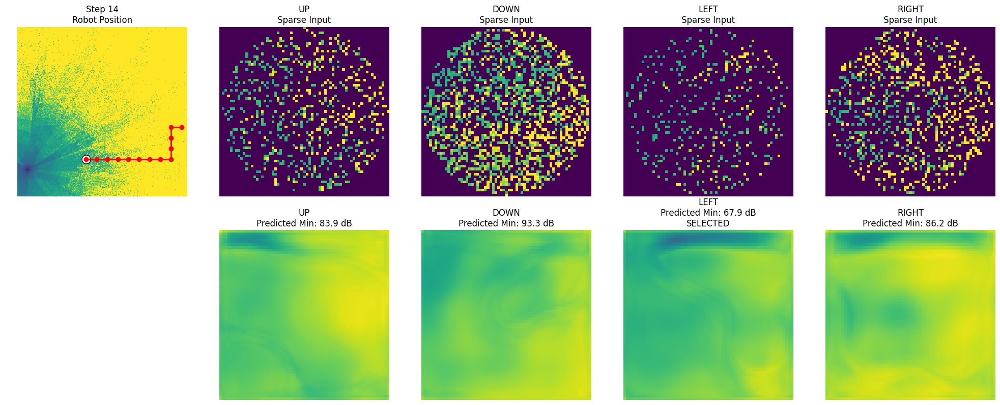


Robot moving LEFT
New position: (103, 199)
Predicted signal: 67.95 dB

Step 15
UP: predicted strongest signal = 84.77 dB
DOWN: predicted strongest signal = 92.76 dB
LEFT: predicted strongest signal = 81.89 dB
RIGHT: cached strongest signal = 82.37 dB

Chosen direction: LEFT
Predicted strongest signal: 81.89 dB


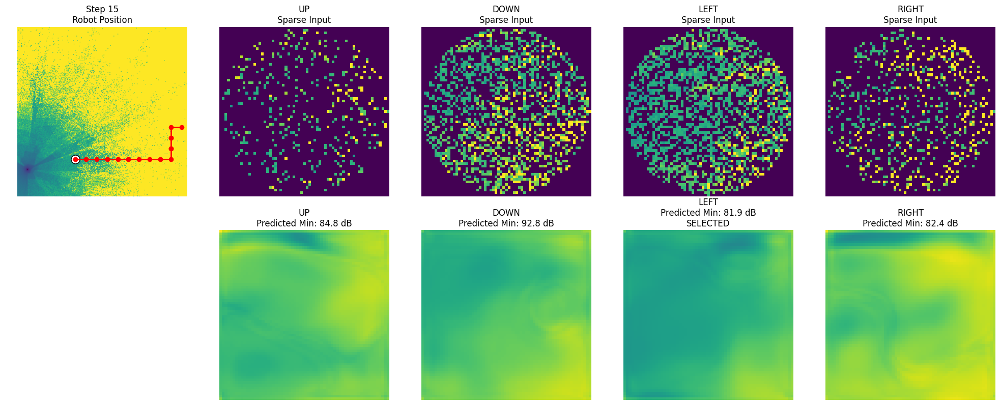


Robot moving LEFT
New position: (87, 199)
Predicted signal: 81.89 dB

Step 16
UP: predicted strongest signal = 74.18 dB
DOWN: predicted strongest signal = 88.28 dB
LEFT: predicted strongest signal = 81.86 dB
RIGHT: cached strongest signal = 67.95 dB

Chosen direction: RIGHT
Predicted strongest signal: 67.95 dB


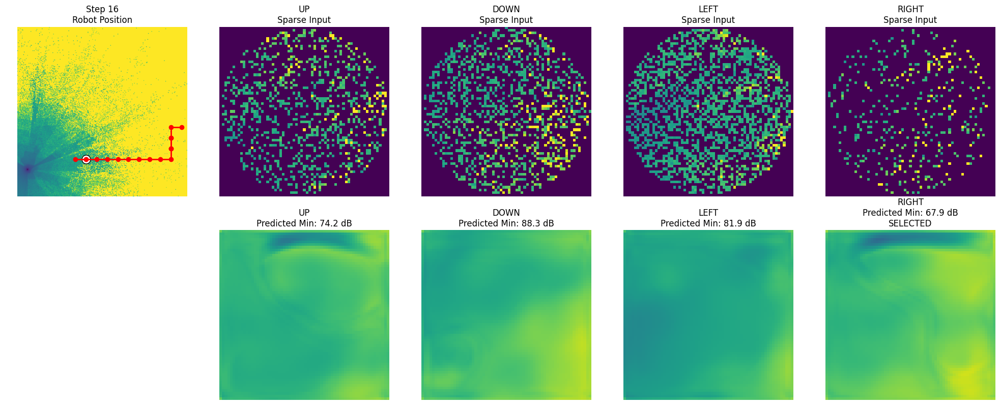


Robot moving RIGHT
New position: (103, 199)
Predicted signal: 67.95 dB

Step 17
UP: cached strongest signal = 84.77 dB
DOWN: cached strongest signal = 92.76 dB
LEFT: cached strongest signal = 81.89 dB
RIGHT: cached strongest signal = 82.37 dB

Chosen direction: LEFT
Predicted strongest signal: 81.89 dB


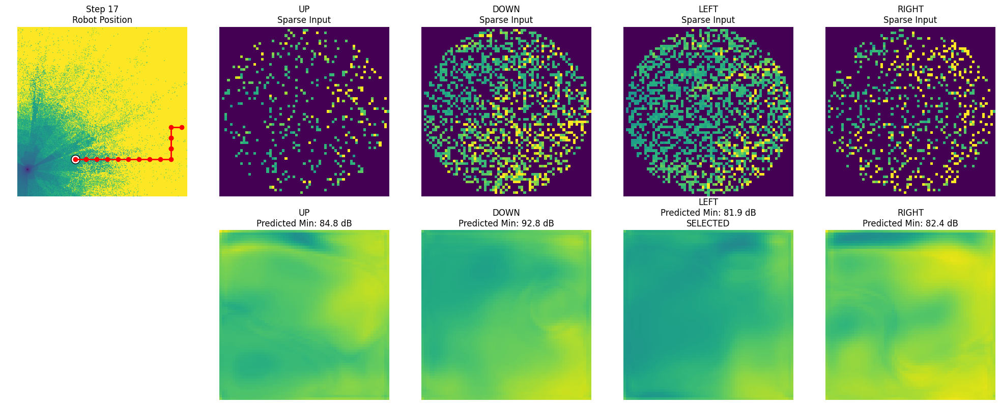


Robot moving LEFT
New position: (87, 199)
Predicted signal: 81.89 dB

Step 18
UP: cached strongest signal = 74.18 dB
DOWN: cached strongest signal = 88.28 dB
LEFT: cached strongest signal = 81.86 dB
Skipping RIGHT to (103, 199) - already visited twice.

Chosen direction: UP
Predicted strongest signal: 74.18 dB


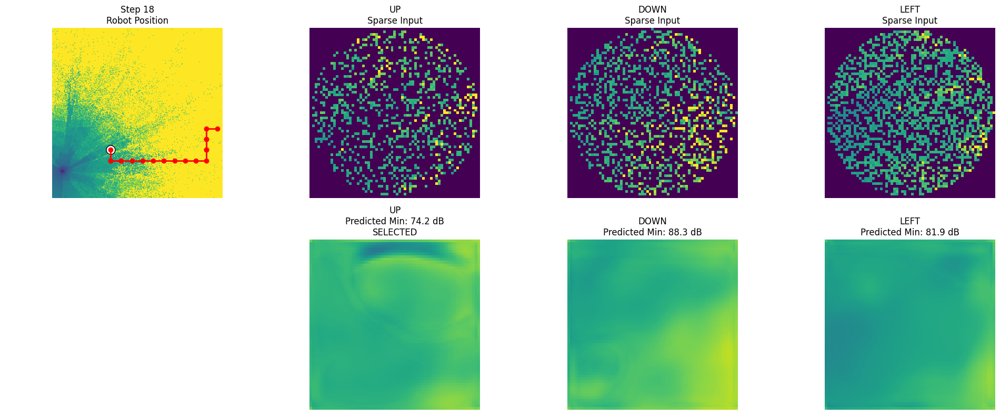


Robot moving UP
New position: (87, 183)
Predicted signal: 74.18 dB

Step 19
UP: predicted strongest signal = 86.93 dB
Skipping DOWN to (87, 199) - already visited twice.
LEFT: predicted strongest signal = 74.94 dB
RIGHT: cached strongest signal = 84.77 dB

Chosen direction: LEFT
Predicted strongest signal: 74.94 dB


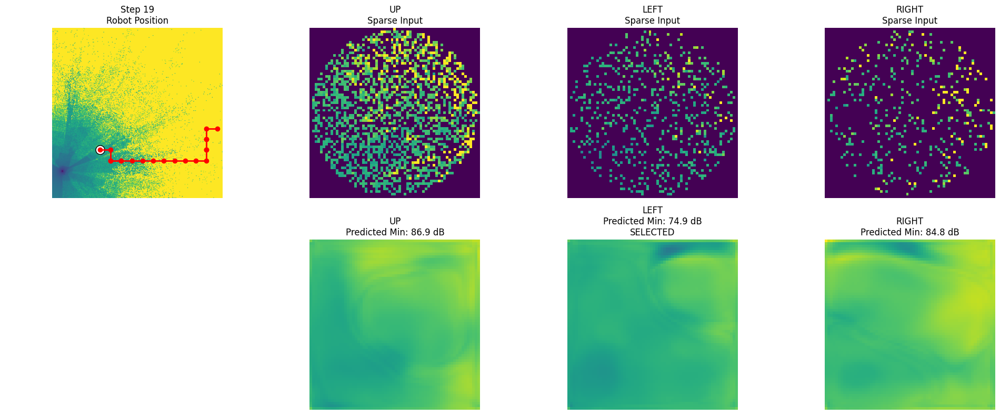


Robot moving LEFT
New position: (71, 183)
Predicted signal: 74.94 dB

Step 20
UP: predicted strongest signal = 89.22 dB
DOWN: cached strongest signal = 81.86 dB
LEFT: predicted strongest signal = 79.91 dB
RIGHT: cached strongest signal = 74.18 dB

Chosen direction: RIGHT
Predicted strongest signal: 74.18 dB


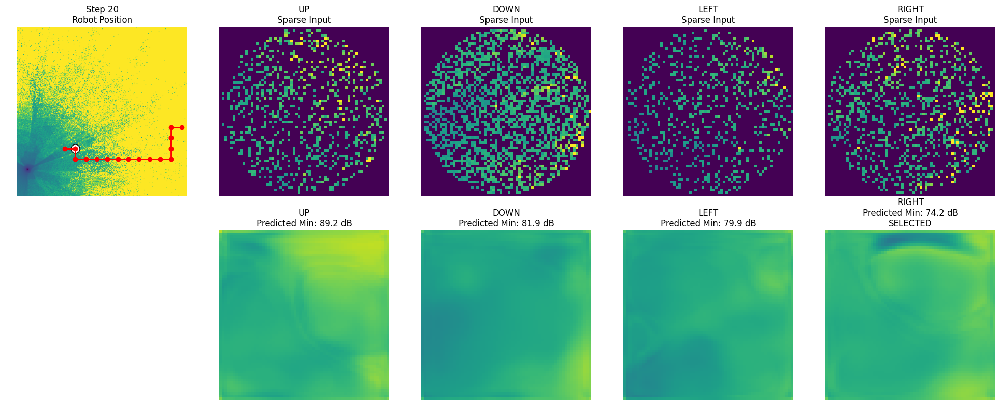


Robot moving RIGHT
New position: (87, 183)
Predicted signal: 74.18 dB

Step 21
UP: cached strongest signal = 86.93 dB
Skipping DOWN to (87, 199) - already visited twice.
LEFT: cached strongest signal = 74.94 dB
RIGHT: cached strongest signal = 84.77 dB

Chosen direction: LEFT
Predicted strongest signal: 74.94 dB


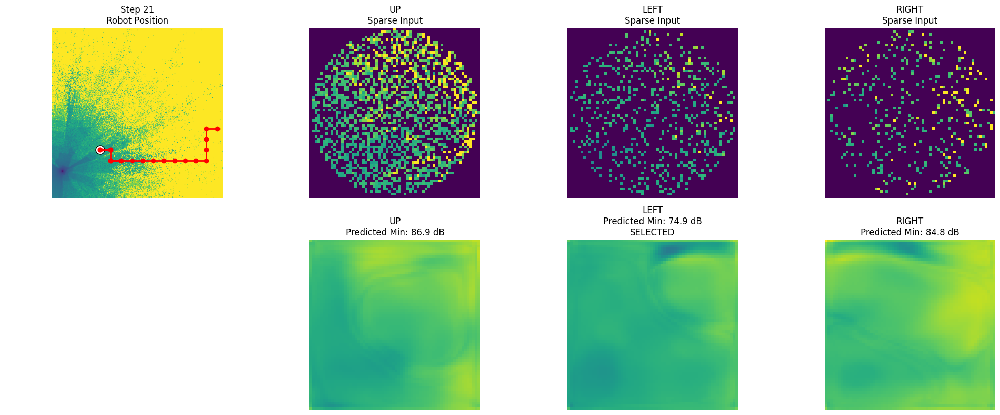


Robot moving LEFT
New position: (71, 183)
Predicted signal: 74.94 dB

Step 22
UP: cached strongest signal = 89.22 dB
DOWN: cached strongest signal = 81.86 dB
LEFT: cached strongest signal = 79.91 dB
Skipping RIGHT to (87, 183) - already visited twice.

Chosen direction: LEFT
Predicted strongest signal: 79.91 dB


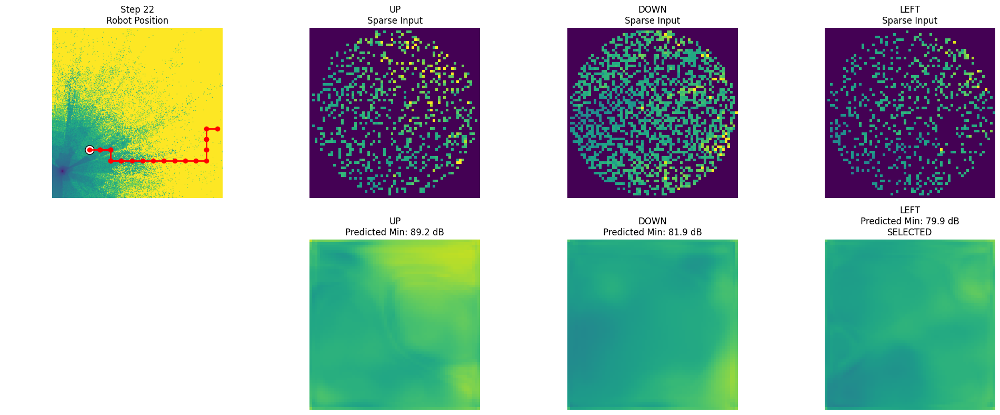


Robot moving LEFT
New position: (55, 183)
Predicted signal: 79.91 dB

Step 23
UP: predicted strongest signal = 67.66 dB
DOWN: predicted strongest signal = 79.01 dB
LEFT: predicted strongest signal = 72.13 dB
Skipping RIGHT to (71, 183) - already visited twice.

Chosen direction: UP
Predicted strongest signal: 67.66 dB


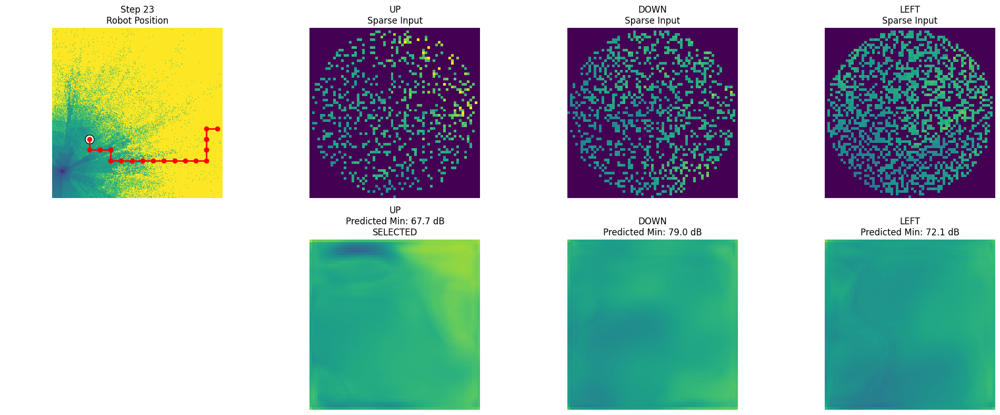


Robot moving UP
New position: (55, 167)
Predicted signal: 67.66 dB

Step 24
UP: predicted strongest signal = 85.12 dB
DOWN: cached strongest signal = 79.91 dB
LEFT: predicted strongest signal = 68.21 dB
RIGHT: cached strongest signal = 89.22 dB

Chosen direction: LEFT
Predicted strongest signal: 68.21 dB


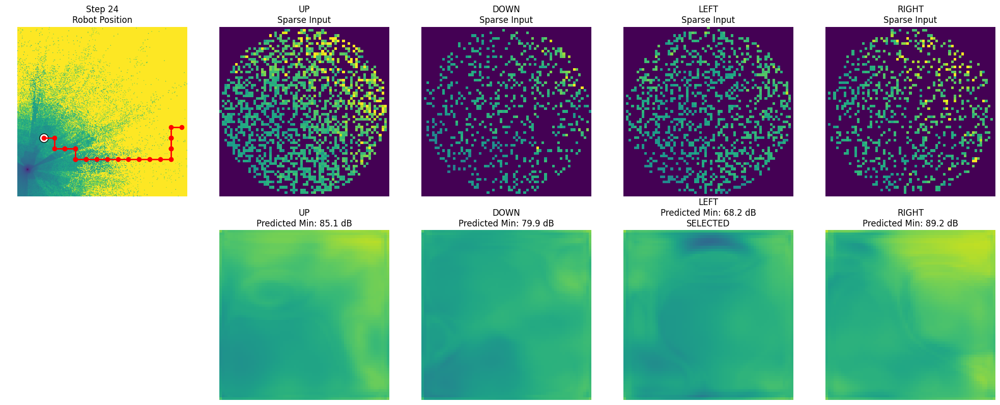


Robot moving LEFT
New position: (39, 167)
Predicted signal: 68.21 dB

Step 25
UP: predicted strongest signal = 79.86 dB
DOWN: cached strongest signal = 72.13 dB
LEFT: predicted strongest signal = 64.72 dB
RIGHT: cached strongest signal = 67.66 dB

Chosen direction: LEFT
Predicted strongest signal: 64.72 dB


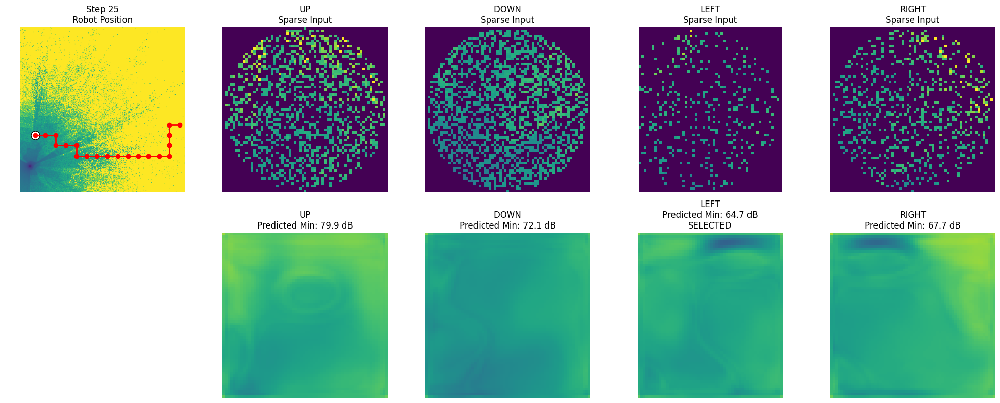


Robot moving LEFT
New position: (23, 167)
Predicted signal: 64.72 dB

Step 26
UP: predicted strongest signal = 85.19 dB
DOWN: predicted strongest signal = 69.55 dB
LEFT: predicted strongest signal = 79.84 dB
RIGHT: cached strongest signal = 68.21 dB

Chosen direction: RIGHT
Predicted strongest signal: 68.21 dB


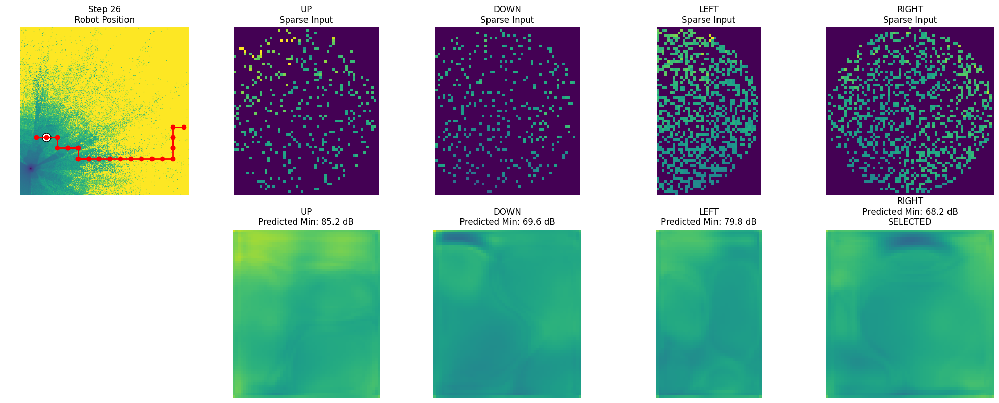


Robot moving RIGHT
New position: (39, 167)
Predicted signal: 68.21 dB

Step 27
UP: cached strongest signal = 79.86 dB
DOWN: cached strongest signal = 72.13 dB
LEFT: cached strongest signal = 64.72 dB
RIGHT: cached strongest signal = 67.66 dB

Chosen direction: LEFT
Predicted strongest signal: 64.72 dB


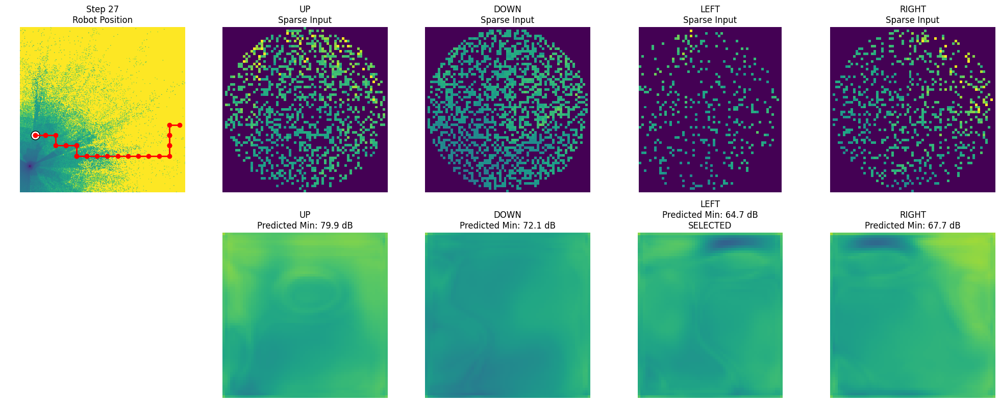


Robot moving LEFT
New position: (23, 167)
Predicted signal: 64.72 dB

Step 28
UP: cached strongest signal = 85.19 dB
DOWN: cached strongest signal = 69.55 dB
LEFT: cached strongest signal = 79.84 dB
Skipping RIGHT to (39, 167) - already visited twice.

Chosen direction: DOWN
Predicted strongest signal: 69.55 dB


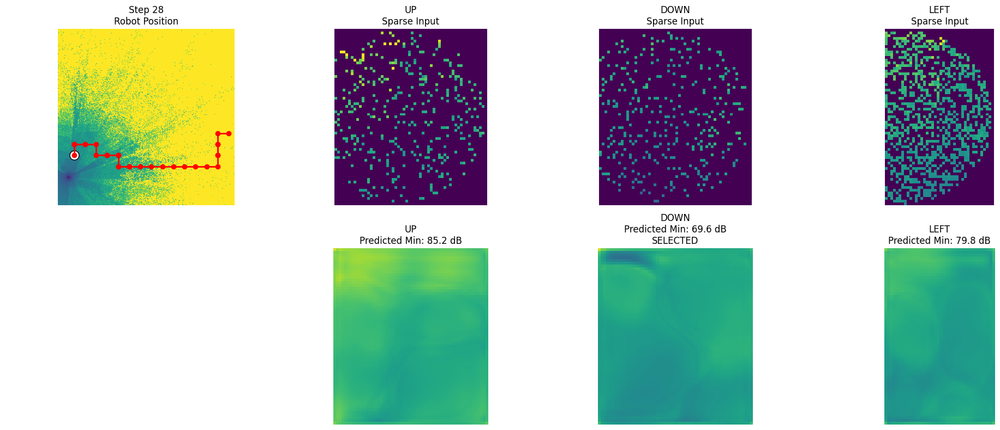


Robot moving DOWN
New position: (23, 183)
Predicted signal: 69.55 dB

Step 29
Skipping UP to (23, 167) - already visited twice.
DOWN: predicted strongest signal = 55.93 dB
LEFT: predicted strongest signal = 73.32 dB
RIGHT: cached strongest signal = 72.13 dB

Chosen direction: DOWN
Predicted strongest signal: 55.93 dB


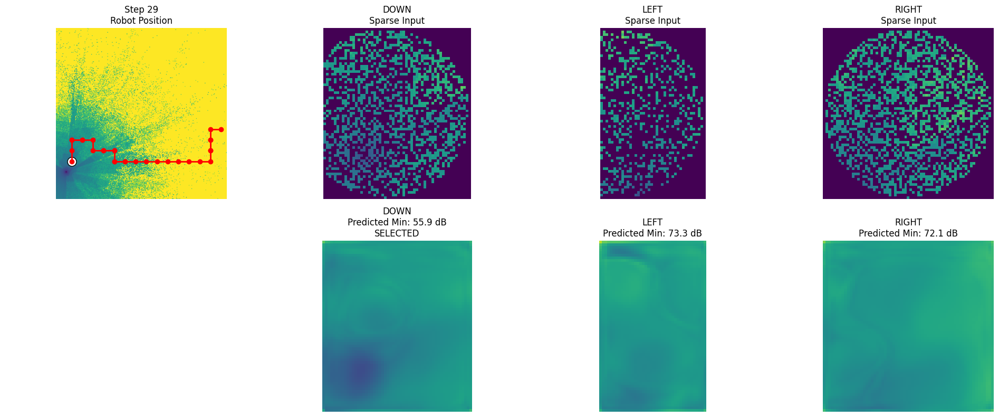


Robot moving DOWN
New position: (23, 199)
Predicted signal: 55.93 dB

Step 30
UP: cached strongest signal = 69.55 dB
DOWN: predicted strongest signal = 53.48 dB
LEFT: predicted strongest signal = 57.70 dB
RIGHT: predicted strongest signal = 59.85 dB

Chosen direction: DOWN
Predicted strongest signal: 53.48 dB


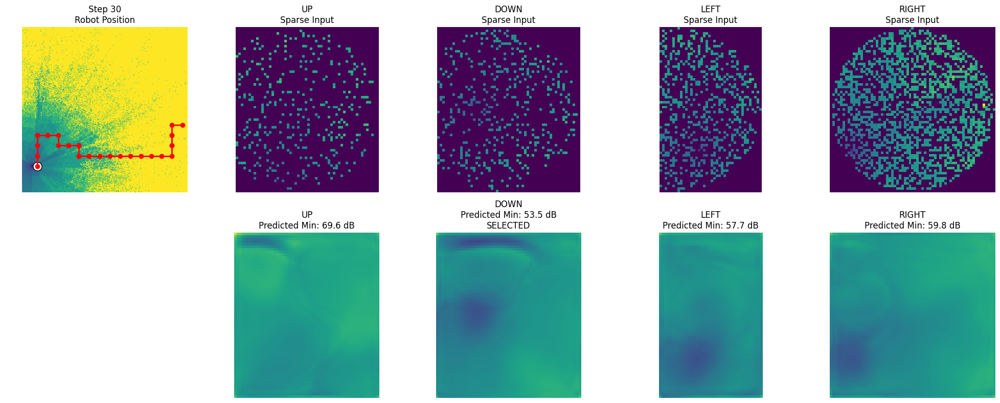


Robot moving DOWN
New position: (23, 215)
Predicted signal: 53.48 dB

Target Signal Found.


In [45]:
from collections import deque, defaultdict
import random

PATCH_SIZE = 16
radius_patches = 2
radius_pixels = radius_patches * PATCH_SIZE

MAX_STEPS = 100
TARGET_DB = 55.0

SPARSITY_MIN = 0.1
SPARSITY_MAX = 0.5

OSCILLATION_THRESHOLD = 2

robot_x = np.random.randint(0, WIDTH)
robot_y = np.random.randint(0, HEIGHT)

trajectory = [(robot_x, robot_y)]

patch_history = {}

# Track recent robot positions
recent_positions = deque(maxlen=6)

# Track how many times each position has been visited by the robot
visited_counts = defaultdict(int)

print(f"Robot start: ({robot_x}, {robot_y})")


def detect_oscillation(position_history):
    """
    Detects A-B-A-B-A-B oscillation pattern.
    """

    if len(position_history) < 6:
        return False

    p0, p1, p2, p3, p4, p5 = position_history

    return (
        p0 == p2 == p4 and
        p1 == p3 == p5 and
        p0 != p1
    )


def create_sparse_input(center_x, center_y):

    sparse_samples = np.zeros_like(
        radio_map,
        dtype=np.float32
    )

    min_x = max(
        0,
        center_x - radius_pixels
    )

    max_x = min(
        WIDTH,
        center_x + radius_pixels + 1
    )

    min_y = max(
        0,
        center_y - radius_pixels
    )

    max_y = min(
        HEIGHT,
        center_y + radius_pixels + 1
    )

    Y_local, X_local = np.ogrid[
        0:(max_y - min_y),
        0:(max_x - min_x)
    ]

    dist = np.sqrt(
        (X_local + min_x - center_x) ** 2 +
        (Y_local + min_y - center_y) ** 2
    )

    circular_mask = dist <= radius_pixels

    coords_y, coords_x = np.where(
        circular_mask
    )

    num_pixels = len(coords_x)

    if num_pixels == 0:
        return None

    num_sparse = np.random.randint(
        int(num_pixels * SPARSITY_MIN),
        int(num_pixels * SPARSITY_MAX) + 1
    )

    num_sparse = min(
        num_sparse,
        num_pixels
    )

    selected = np.random.choice(
        num_pixels,
        num_sparse,
        replace=False
    )

    selected_y_local = coords_y[selected]
    selected_x_local = coords_x[selected]

    selected_y_global = (
        selected_y_local + min_y
    )

    selected_x_global = (
        selected_x_local + min_x
    )

    sparse_samples[
        selected_y_global,
        selected_x_global
    ] = radio_map[
        selected_y_global,
        selected_x_global
    ]

    sparse_norm = np.zeros_like(
        sparse_samples
    )

    valid_mask = sparse_samples > 0

    sparse_norm[valid_mask] = (
        sparse_samples[valid_mask] - MIN_DB
    ) / (MAX_DB - MIN_DB)

    sparse_norm = np.clip(
        sparse_norm,
        0.0,
        1.0
    )

    env_crop = env_map[
        min_y:max_y,
        min_x:max_x
    ]

    tx_crop = tx_map[
        min_y:max_y,
        min_x:max_x
    ]

    sparse_crop = sparse_norm[
        min_y:max_y,
        min_x:max_x
    ]

    inputs_np = np.stack(
        [
            env_crop,
            tx_crop,
            sparse_crop
        ],
        axis=0
    )

    input_tensor = (
        torch.from_numpy(inputs_np)
        .float()
        .unsqueeze(0)
        .to(device)
    )

    return (
        input_tensor,
        min_x,
        max_x,
        min_y,
        max_y
    )


# Robot Loop
step = 0
while True:
    step += 1
    if step > MAX_STEPS:
        print("Maximum steps reached without finding target signal.")
        break

    print(f"\nStep {step}")

    recent_positions.append(
        (robot_x, robot_y)
    )

    candidate_moves = {

        "UP": (
            robot_x,
            robot_y - PATCH_SIZE
        ),

        "DOWN": (
            robot_x,
            robot_y + PATCH_SIZE
        ),

        "LEFT": (
            robot_x - PATCH_SIZE,
            robot_y
        ),

        "RIGHT": (
            robot_x + PATCH_SIZE,
            robot_y
        ),
    }

    best_direction = None
    best_score = np.inf
    best_position = (
        robot_x,
        robot_y
    )

    direction_visualizations = []

    # Evaluate candidate moves using cache

    for direction, (new_x, new_y) in candidate_moves.items():

        # Boundary checks
        if new_x < 0 or new_x >= WIDTH:
            continue

        if new_y < 0 or new_y >= HEIGHT:
            continue

        # Skip if this candidate position has been visited 2 or more times
        if visited_counts[(new_x, new_y)] >= 2:
            print(f"Skipping {direction} to ({new_x}, {new_y}) - already visited twice.")
            continue

        cache_key = (
            new_x,
            new_y
        )

        # Use cached result if already evaluated
        if cache_key in patch_history:

            cached = patch_history[
                cache_key
            ]

            predicted_best_signal = (
                cached["score"]
            )

            print(
                f"{direction}: "
                f"cached strongest signal = "
                f"{predicted_best_signal:.2f} dB"
            )

            direction_visualizations.append({

                "direction": direction,

                "position": (
                    new_x,
                    new_y
                ),

                "score": cached["score"],

                "reconstruction":
                    cached["reconstruction"],

                "sparse_input":
                    cached["sparse_input"],

                "bounds":
                    cached["bounds"]
            })

            if (
                predicted_best_signal
                < best_score
            ):

                best_score = (
                    predicted_best_signal
                )

                best_direction = direction

                best_position = (
                    new_x,
                    new_y
                )

            continue

        # Not cached -> reconstruct once
        result = create_sparse_input(
            new_x,
            new_y
        )

        if result is None:
            continue

        (
            input_tensor,
            min_x,
            max_x,
            min_y,
            max_y
        ) = result

        model.eval()

        with torch.no_grad():

            reconstruction = model(
                input_tensor
            )

        reconstruction_np = (
            reconstruction
            .squeeze()
            .cpu()
            .numpy()
        )

        reconstruction_db = (

            reconstruction_np
            * (MAX_DB - MIN_DB)

        ) + MIN_DB

        predicted_best_signal = np.min(
            reconstruction_db
        )

        sparse_input_np = (
            input_tensor[0, 2]
            .cpu()
            .numpy()
        )

        bounds = (
            min_x,
            max_x,
            min_y,
            max_y
        )

        # Store in cache
        patch_history[cache_key] = {

            "score":
                predicted_best_signal,

            "reconstruction":
                reconstruction_db,

            "sparse_input":
                sparse_input_np,

            "bounds":
                bounds
        }

        print(
            f"{direction}: "
            f"predicted strongest signal = "
            f"{predicted_best_signal:.2f} dB"
        )

        direction_visualizations.append({

            "direction": direction,

            "position": (
                new_x,
                new_y
            ),

            "score":
                predicted_best_signal,

            "reconstruction":
                reconstruction_db,

            "sparse_input":
                sparse_input_np,

            "bounds":
                bounds
        })

        if (
            predicted_best_signal
            < best_score
        ):

            best_score = (
                predicted_best_signal
            )

            best_direction = direction

            best_position = (
                new_x,
                new_y
            )

    # Oscillation detection
    oscillating = detect_oscillation(
        list(recent_positions)
    )

    if len(direction_visualizations) == 0:

        print(
            "No valid moves found (all neighbors visited twice or out of bounds)."
        )

        break

    # Move selection
    if oscillating:
        print(
            "\nOscillation detected."
            " Attempting to select a less frequently visited patch."
        )

        less_visited_moves = []
        for item in direction_visualizations:
            pos = item["position"]
            # Filter to moves that have been visited less than 2 times
            if visited_counts[pos] < 2:
                less_visited_moves.append(item)

        if len(less_visited_moves) > 0:
            best_item = random.choice(less_visited_moves)
            print(f"Selected less visited patch (during oscillation): {best_item['position']}")
        else:
            # If all valid moves have been visited 2 times (this case should ideally not happen if filtering works perfectly earlier)
            print(
                "All neighboring patches have been visited 2 times. "
                "Random choice selected"
            )
            sorted_moves = sorted(direction_visualizations, key=lambda x: x["score"])
            top_k = max(1, len(sorted_moves) // 2)
            best_item = random.choice(sorted_moves[:top_k])

    else:

        best_item = min(
            direction_visualizations,
            key=lambda x: x["score"]
        )

    best_direction = (
        best_item["direction"]
    )

    best_score = (
        best_item["score"]
    )

    best_position = (
        best_item["position"]
    )

    robot_x, robot_y = (
        best_position
    )

    trajectory.append(
        (
            robot_x,
            robot_y
        )
    )

    # Increment visit count for the new robot position
    visited_counts[(robot_x, robot_y)] += 1

    print(
        f"\nChosen direction: "
        f"{best_direction}"
    )

    print(
        f"Predicted strongest signal: "
        f"{best_score:.2f} dB"
    )

    # Visualization

    fig, axes = plt.subplots(
        2,
        len(direction_visualizations) + 1,
        figsize=(20, 8)
    )

    # Full Map
    axes[0, 0].imshow(
        radio_map,
        cmap="viridis",
        aspect='equal'
    )

    traj = np.array(
        trajectory
    )

    axes[0, 0].plot(
        traj[:, 0],
        traj[:, 1],
        color="red",
        marker="o",
        linewidth=2
    )

    axes[0, 0].scatter(
        robot_x,
        robot_y,
        c="white",
        s=150,
        edgecolors="black"
    )

    axes[0, 0].set_title(
        f"Step {step}\nRobot Position"
    )

    axes[0, 0].axis("off")

    axes[1, 0].axis("off")

    for idx, item in enumerate(
        direction_visualizations
    ):

        direction = (
            item["direction"]
        )

        score = (
            item["score"]
        )

        sparse_input = (
            item["sparse_input"]
        )

        reconstruction = (
            item["reconstruction"]
        )

        # Sparse input
        axes[0, idx + 1].imshow(
            sparse_input,
            cmap="viridis",
            vmin=0,
            vmax=1,
            aspect='equal'
        )

        axes[0, idx + 1].set_title(
            f"{direction}\nSparse Input"
        )

        axes[0, idx + 1].axis("off")

        # Reconstruction
        axes[1, idx + 1].imshow(
            reconstruction,
            cmap="viridis",
            vmin=30,
            vmax=140,
            aspect='equal'
        )

        title = (
            f"{direction}\n"
            f"Predicted Min: "
            f"{score:.1f} dB"
        )

        if (
            direction
            == best_direction
        ):
            title += "\nSELECTED"

        axes[1, idx + 1].set_title(
            title
        )

        axes[1, idx + 1].axis("off")

    plt.tight_layout()
    plt.show()

    print(
        f"\nRobot moving "
        f"{best_direction}"
    )

    print(
        f"New position: "
        f"({robot_x}, {robot_y})"
    )

    print(
        f"Predicted signal: "
        f"{best_score:.2f} dB"
    )


    # Stop condition

    if best_score <= TARGET_DB:

        print(
            "\nTarget Signal Found."
        )

        break